## Жёлтое такси в Нью-Йорке. Часть 4
Финальный проект специализации __Машинное обучение и анализ данных от Яндекса и МФТИ.__

__Задача проекта__ — научиться предсказывать количество поездок в ближайшие часы в каждом районе Нью-Йорка. Для обучения использовались данные с мая 2014 г. по май 2016 г. Прогнозы составлены на июнь 2016 г.

In [1]:
# !pip install watermark
%load_ext watermark

In [2]:
%watermark -v -m -p numpy,scipy,pandas,matplotlib -g

Python implementation: CPython
Python version       : 3.8.10
IPython version      : 7.28.0

numpy     : 1.20.1
scipy     : 1.6.2
pandas    : 1.2.2
matplotlib: 3.4.3

Compiler    : GCC 9.3.0
OS          : Linux
Release     : 5.4.0-88-generic
Machine     : x86_64
Processor   : x86_64
CPU cores   : 8
Architecture: 64bit

Git hash: 014ec687203d85a6bc885fae5b1fd9d90404306d



In [3]:
# For compatibility with future Python versions
from __future__ import division

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

# Main system library importing
import os
import sys

# Main modelling libraries importing
import numpy as np
import pandas as pd
import holidays
import datetime

# Main statistical library importing
from scipy import stats as sts
import statsmodels.api as sm
from itertools import product
from collections import Counter

# Main visual library importing
# Standard visualize
import matplotlib.image as pltimg
import matplotlib.cm as cm
from matplotlib import pylab as plt

# To create pipeline functions
from joblib import dump, load

# Normilizers
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler

# Dimension decreasers
from sklearn.decomposition import PCA, TruncatedSVD
from sklearn.manifold import MDS, TSNE
from sklearn.random_projection import SparseRandomProjection

# Clusteres
from sklearn.cluster import KMeans, AgglomerativeClustering, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import NearestNeighbors

# Clustering metrics
from sklearn.metrics import silhouette_samples, silhouette_score, pairwise_distances

In [4]:
# Получение списка имён колонок по датам.
def get_dates_names(dates_list, min_date, max_date):
    res = list(filter(lambda x: x>= datetime.datetime.strptime(min_date, '%Y-%m-%d %H:%M:%S') and 
                      x < datetime.datetime.strptime(max_date, '%Y-%m-%d %H:%M:%S'), 
                      dates_list))
    return [i.strftime('%Y-%m-%d %H:%M:%S') for i in res]
    return res

In [5]:
def decrease_dimension(data, num_of_components, random_state, model_preds=None):
    fig, axs = plt.subplots(2, 3, figsize=(20, 15))

    # Рассмотрим несколько самых популярных методов понижения размерности
    obs = [
           # Метод случайных проекций - линейный
           SparseRandomProjection(num_of_components, random_state=random_state),
           # Метод главных компонент - линейный
           PCA(num_of_components, random_state=random_state),
           # Метод сингулярного разложения - линейный
           TruncatedSVD(num_of_components, random_state=random_state),
           # Метод t-stochastic neighbour embedding - нелинейный, с инициализацией pca
           TSNE(num_of_components, random_state=random_state, init="pca"),
           # Метод t-stochastic neighbour embedding - нелинейный, с инициализацией random
           TSNE(num_of_components, random_state=random_state, init="random"),
           # Метод многомерного шкалирования - нелинейный
           MDS(num_of_components, random_state=random_state)
          ]

    titles = ['Random projection', 'PCA', 'TruncatedSVD', 'TSNE(pca)', 'TSNE(random)', 'MDS']
    for i in range(len(obs)):
        points = obs[i].fit_transform(data)
        ax = axs[i % 2, i % 3]
        ax.scatter([j[0] for j in points], [j[1] for j in points], c=model_preds)
        ax.set_title(titles[i])

In [6]:
def draw_counter_bar(model_preds):
    print(Counter(model_preds))

    fig, ax = plt.subplots(figsize=(5, 5))
    x = list(Counter(sorted(model_preds)).keys())
    y = list(Counter(sorted(model_preds)).values())
    ax.bar(x, y)

    plt.show()

In [7]:
def draw_save_map(model_preds, filename):
    fig, axs = plt.subplots(1, len(set(model_preds)))
    for i in set(model_preds):
        ax = axs[i]
        title = 'Кластер {}'.format(i)
        colr = colors.to_rgb(color_hex[i])
        ax.imshow([[colr for x in range(20)] for y in range(20)])
        ax.set_title(title)
        ax.axis('off')
    plt.show()


    # Карта
    m = folium.Map(location=[40.75, -73.96],  
                   zoom_start=11, 
                   png_enabled=False)

    coord_data = np.array(data.iloc[:, :5])

    features = []
    for i in range(data.shape[0]):

        west = coord_data[i][1]
        east = coord_data[i][2]
        south = coord_data[i][3]
        north = coord_data[i][4]

        left_down = (south, west)
        left_up = (north, west)
        right_up = (north, east)
        right_down = (south, east)

        color = color_hex[model_preds[i]]
        folium.vector_layers.Rectangle([left_down, left_up, right_up, right_down], 
                                       popup=None, 
                                       tooltip=f'Кластер {model_preds[i]}', 
                                       fill=True, 
                                       fill_color=color, 
                                       fill_opacity=0.5,
                                       stroke=True, 
                                       color='black', 
                                       weight=1, 
                                       opacity=0.3).add_to(m)
    
    # Сохраняем карту в формате html
    m.save('{}.html'.format(filename))


    # Сохраняем в png
    outdir = os.path.dirname(os.path.abspath('file'))
    url = f"file://{os.getcwd()}/{filename}.html"
    outfn = os.path.join(outdir, f"{filename}.png")
    com = f'cutycapt --url={url} --out={outfn} --delay=1000 --plugins=on --javascript=on --js-can-access-clipboard=on --java=on'
    os.system(com)
    
    # Печатаем
    plt.figure(figsize=(18, 15))
    map_image = pltimg.imread(f"{filename}.png")
    plt.imshow(map_image)
    plt.axis('off')
    plt.show()

In [8]:
def siluette_check(data,  
                   clusterer_name="KMeans",
                   random_state=42,
                   num_of_dimensions=2,
                   eps_=27,
                   min_samples_=2
                  ):
    
    # Массив перебераемых значений количества кластеров
    range_n_clusters = [2, 3, 4, 5, 6]

    for n_clusters in range_n_clusters:
        # Создаем сабплот
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        # 1ый график для критерия силуэт
        # По определению значение критерия лежит от -1 до 1. Примем субъективное ограничение от 0 до 1
        ax1.set_xlim([0, 1])
        # Добавим небольшое смещение для графика, чтобы было удобнее их различать
        ax1.set_ylim([0, len(vals) + (n_clusters + 1) * 10])

        # Лейблы от конкретной модели кластеризации
        if clusterer_name == "KMeans":
            clusterer = KMeans(n_clusters=n_clusters, 
                               random_state=random_state)
        elif clusterer_name == "EM":
            clusterer = GaussianMixture(n_components=n_clusters, 
                                        covariance_type='diag', 
                                        random_state=random_state)
        elif clusterer_name == "DBSCAN":
            clusterer = DBSCAN(eps=eps_, 
                               min_samples=min_samples_)
        elif clusterer_name == "AGH":
            clusterer = AgglomerativeClustering(n_clusters=n_clusters, 
                                                affinity='euclidean', 
                                                linkage='ward')
            
        cluster_labels = clusterer.fit_predict(data)

        # Подсчитаем среднее значение силэута для всей выборки при помощи silhouette_score
        # Это дает представление о плотности и разделении сформированных кластеров
        silhouette_avg = silhouette_score(data, cluster_labels)
        print(
            "For n_clusters =",
            n_clusters,
            "The average silhouette_score is :",
            silhouette_avg,
        )

        # Подсчитаем значение силэута для выборки при помощи silhouette_samples
        sample_silhouette_values = silhouette_samples(data, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):

            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        # The vertical line for average silhouette score of all the values
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1])

        # Понижение размерности для визуализации
        dimension_decreaser = TSNE(num_of_dimensions, 
                                   random_state=random_state, 
                                   init="random"
                                  )

        points = dimension_decreaser.fit_transform(vals)

        # 2nd Plot showing the actual clusters formed
        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(
            [j[0] for j in points], [j[1] for j in points], 
            marker="o", s=100, lw=0, c=colors, edgecolor="k"
        )

        ax2.set_title("The visualization of the clustered data with TSNE")
        ax2.set_xlabel("Feature space for the 1st feature")
        ax2.set_ylabel("Feature space for the 2nd feature")

        plt.suptitle(
            f"Silhouette analysis for {clusterer_name} on sample data with n_clusters = {n_clusters}",
            fontsize=14,
            fontweight="bold",
        )

    plt.show()

### Чтение данных, составление таблицы
Возьмем данные декабря 2015-го по апрель 2016-го года. Отдельно возьмем май 16-го и июнь 16-го.

In [9]:
dir_with_data = os.path.abspath('/media/tater/MainStorage/TaxiRoutes')
filename = os.path.join(dir_with_data, 'all_count.csv')
filename

'/media/tater/MainStorage/TaxiRoutes/all_count.csv'

In [10]:
data = pd.read_csv(filename, sep=',', header=0, 
                   date_parser=lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))

In [11]:
data.head()

,region,west,east,south,north,2014-05-01 00:00:00,2014-05-01 01:00:00,2014-05-01 02:00:00,2014-05-01 03:00:00,2014-05-01 04:00:00,...,2016-05-31 14:00:00,2016-05-31 15:00:00,2016-05-31 16:00:00,2016-05-31 17:00:00,2016-05-31 18:00:00,2016-05-31 19:00:00,2016-05-31 20:00:00,2016-05-31 21:00:00,2016-05-31 22:00:00,2016-05-31 23:00:00
0,1075,-74.022246,-74.011135,40.697437,40.705825,36.0,19.0,9.0,2.0,7.0,...,124.0,105.0,80.0,84.0,106.0,106.0,99.0,84.0,83.0,34.0
1,1076,-74.022246,-74.011135,40.705825,40.714213,52.0,34.0,16.0,7.0,9.0,...,214.0,208.0,156.0,202.0,213.0,167.0,166.0,173.0,98.0,77.0
2,1077,-74.022246,-74.011135,40.714213,40.722601,41.0,25.0,13.0,2.0,4.0,...,104.0,69.0,67.0,109.0,173.0,171.0,165.0,107.0,127.0,58.0
3,1125,-74.011135,-74.000023,40.697437,40.705825,56.0,27.0,17.0,4.0,11.0,...,96.0,70.0,68.0,109.0,126.0,88.0,65.0,78.0,94.0,53.0
4,1126,-74.011135,-74.000023,40.705825,40.714213,174.0,83.0,56.0,36.0,37.0,...,205.0,213.0,168.0,250.0,281.0,293.0,301.0,256.0,174.0,118.0


In [12]:
dates = [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in data.columns[5:]]

In [13]:
dec_apr_data = data[list(data.columns[:5]) + 
                    get_dates_names(dates, '2015-12-01 00:00:00', '2016-05-01 00:00:00')]
dec_apr_data.columns = list(dec_apr_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in dec_apr_data.columns[5:]]
may_data = data[list(data.columns[:5]) + 
                get_dates_names(dates, '2016-05-01 00:00:00', '2016-06-01 00:00:00')]
may_data.columns = list(may_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in may_data.columns[5:]]

In [14]:
# Повернем таблицу, убрем лишние строки.
data_for_clustering = dec_apr_data.transpose()
data_for_clustering.columns = np.array(data.region)
data_for_clustering = data_for_clustering.iloc[5:, :]
data_for_clustering.head()

,1075,1076,1077,1125,1126,1127,1128,1129,1130,1131,...,1630,1684,1733,1734,1783,2068,2069,2118,2119,2168
2015-12-01 00:00:00,19.0,43.0,26.0,76.0,91.0,129.0,202.0,230.0,212.0,56.0,...,3.0,0.0,2.0,97.0,29.0,96.0,16.0,246.0,31.0,118.0
2015-12-01 01:00:00,16.0,22.0,12.0,29.0,71.0,84.0,89.0,118.0,177.0,18.0,...,7.0,0.0,0.0,2.0,0.0,17.0,4.0,104.0,5.0,75.0
2015-12-01 02:00:00,8.0,19.0,3.0,9.0,21.0,42.0,76.0,99.0,180.0,14.0,...,5.0,0.0,0.0,0.0,0.0,4.0,1.0,28.0,0.0,0.0
2015-12-01 03:00:00,3.0,12.0,5.0,7.0,17.0,33.0,45.0,93.0,136.0,12.0,...,7.0,0.0,0.0,0.0,0.0,0.0,0.0,50.0,0.0,0.0
2015-12-01 04:00:00,2.0,12.0,3.0,7.0,21.0,33.0,27.0,62.0,80.0,3.0,...,4.0,1.0,0.0,4.0,2.0,2.0,0.0,23.0,1.0,15.0


### Стандартизация данных

In [15]:
data_for_clustering[data_for_clustering.columns] = StandardScaler().fit_transform(data_for_clustering)
data_for_clustering.head()

,1075,1076,1077,1125,1126,1127,1128,1129,1130,1131,...,1630,1684,1733,1734,1783,2068,2069,2118,2119,2168
2015-12-01 00:00:00,-1.059249,-1.059793,-0.967507,0.263459,-0.896916,-0.967658,-0.534278,-0.547410,-0.756211,-0.984693,...,-0.407136,-0.872440,-0.612507,-0.694292,-1.055433,0.172806,0.827983,1.526366,0.095599,1.402640
2015-12-01 01:00:00,-1.137490,-1.313825,-1.209043,-0.897258,-1.100342,-1.282486,-1.187228,-1.099971,-0.905581,-1.501337,...,0.475093,-0.872440,-0.965776,-1.320248,-1.282767,-1.198001,-0.666935,-0.364634,-0.938190,0.270499
2015-12-01 02:00:00,-1.346132,-1.350115,-1.364316,-1.391179,-1.608908,-1.576325,-1.262346,-1.193709,-0.892778,-1.555720,...,0.033978,-0.872440,-0.965776,-1.333426,-1.282767,-1.423577,-1.040665,-1.376718,-1.136996,-1.704166
2015-12-01 03:00:00,-1.476534,-1.434792,-1.329811,-1.440572,-1.649593,-1.639290,-1.441474,-1.223310,-1.080558,-1.582912,...,0.475093,-0.872440,-0.965776,-1.333426,-1.282767,-1.492985,-1.165242,-1.083747,-1.136996,-1.704166
2015-12-01 04:00:00,-1.502614,-1.434792,-1.364316,-1.440572,-1.608908,-1.639290,-1.545484,-1.376252,-1.319551,-1.705275,...,-0.186579,-0.791252,-0.965776,-1.307070,-1.267089,-1.458281,-1.165242,-1.443303,-1.097235,-1.309233


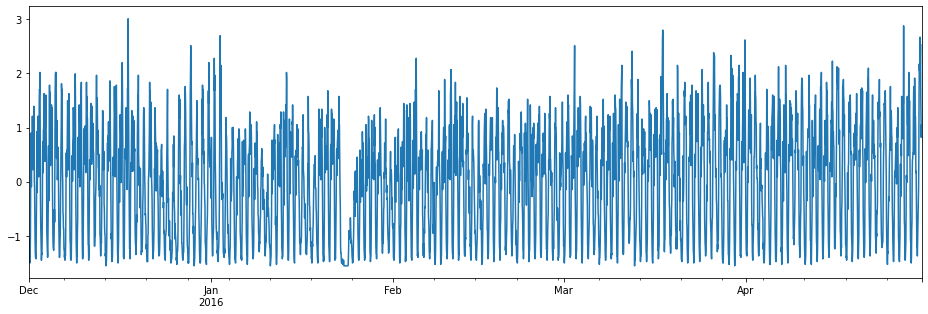

In [16]:
# Посмотрим на какой-нибудь график
fig, ax = plt.subplots(figsize=(16,5))
data_for_clustering[1075].plot()
plt.show()

### Кластеризация

#### Понижение размерности.

Попробуем понизить размерность до двух, и напечатать результаты на плоскости.  
Применим методы случайных и главных компонент, Truncated SVD, MDS, TSNE.

In [17]:
# Векторизируем значения временных рядов
vals = np.array(data_for_clustering).T
# До какой размерности понижаем
num_of_components = 2
# Зафиксируем состояние
random_state = 42

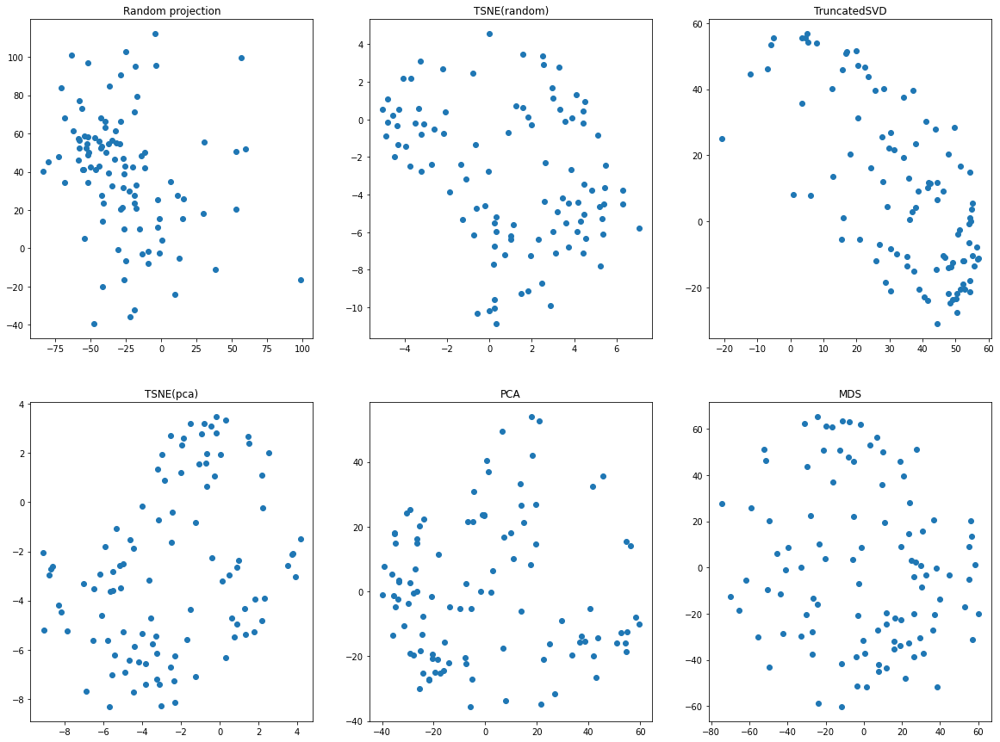

In [18]:
decrease_dimension(vals, num_of_components, random_state)

На TSNE визуально точки делятся либо на 3, либо на 5-6 кластеров.
Досконально точно затруднительно описать

#### Кластирезация методом K-Means.
Рассмотрим его как кластеризацию в первом приближении

{1: 494.0,
 2: 424.0,
 3: 384.0,
 4: 363.0,
 5: 349.0,
 6: 336.0,
 7: 329.0,
 8: 320.0,
 9: 313.0}

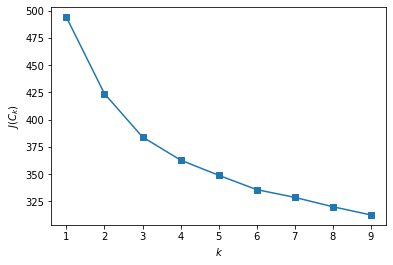

In [19]:
# Попробуем оценить количество кластеров для метода KMeans. 
# Используем эвристику (elbow), подбирать k будем исходя из падения критерия J(C) "не так сильно"
inertia = []
max_num_clusters = 10

for k in range(1, max_num_clusters):
    kmeans = KMeans(n_clusters=k, random_state=42).fit(vals)
    inertia.append(np.sqrt(kmeans.inertia_))

plt.plot(range(1, max_num_clusters), inertia, marker='s')
plt.xlabel('$k$')
plt.ylabel('$J(C_k)$')

{num: round(inrt, 0) for num, inrt in zip(range(1, max_num_clusters), inertia)}

Примем, что начиная с 3 кластера значение критерия J(C) падает не очень сильно, менее 10 на каждый новый кластер

In [20]:
# Инициализируем количество кластеров
num_of_clusters = 3

In [21]:
km_model = KMeans(n_clusters=num_of_clusters, random_state=random_state)
km_preds = km_model.fit_predict(vals)

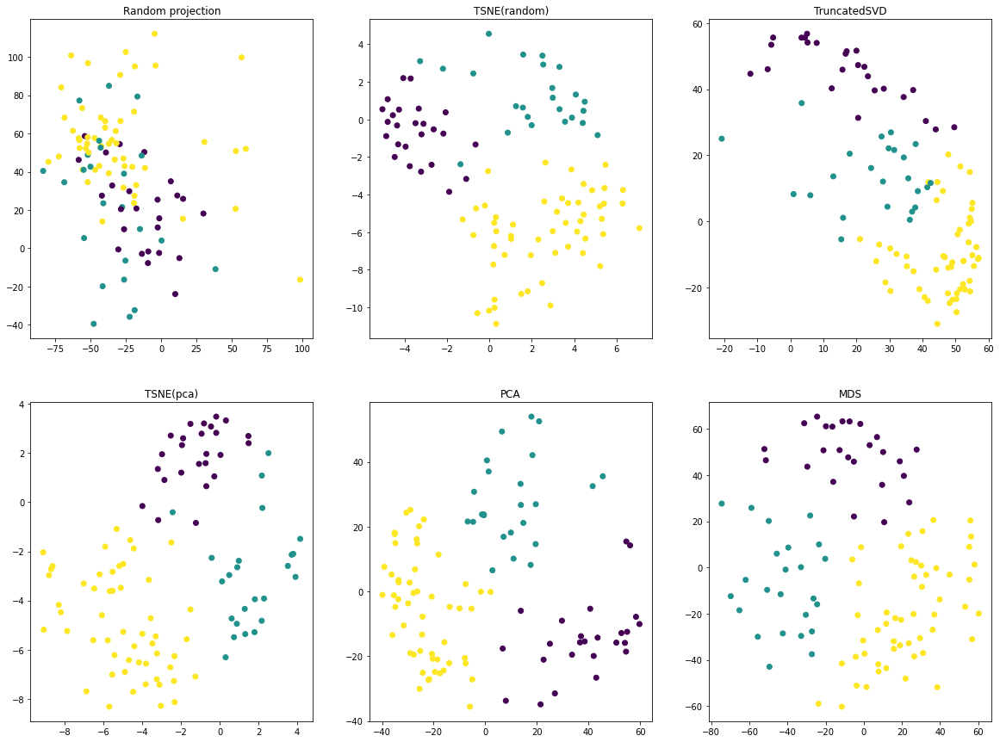

In [22]:
decrease_dimension(vals, num_of_components, random_state, km_preds)

Наша гипотеза о 3 кластерах визуально неплохо подтверждается.   
Оценим количественно качество кластеризации. Так как у нас не сущестует предварительно размеченных кластеров, мы можем использовать критерий __силуэта__.  
Подбирать количество кластеров будем исходя из максимального значения силуэта.  
Переберем значения кластеров от 2 до 6

For n_clusters = 2 The average silhouette_score is : 0.24189265288895018
For n_clusters = 3 The average silhouette_score is : 0.25760638164437216
For n_clusters = 4 The average silhouette_score is : 0.19873797730636186
For n_clusters = 5 The average silhouette_score is : 0.20101013290292954
For n_clusters = 6 The average silhouette_score is : 0.20085409953411956


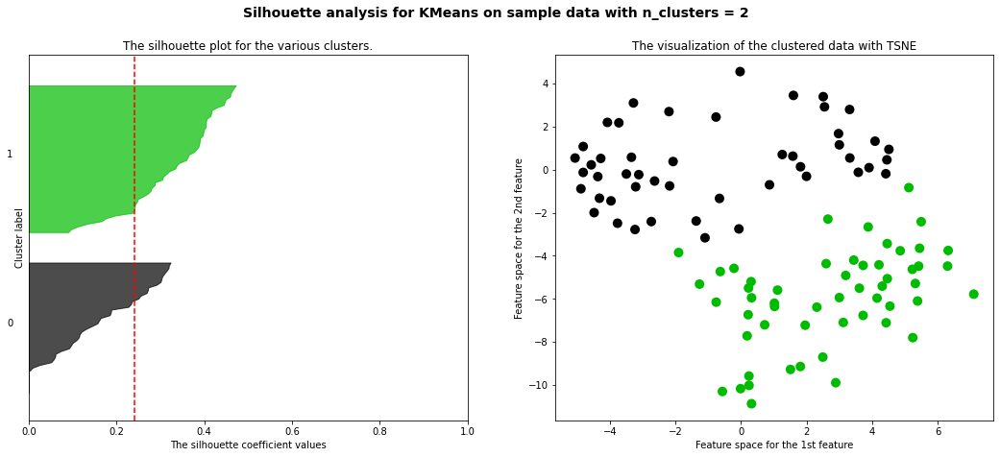

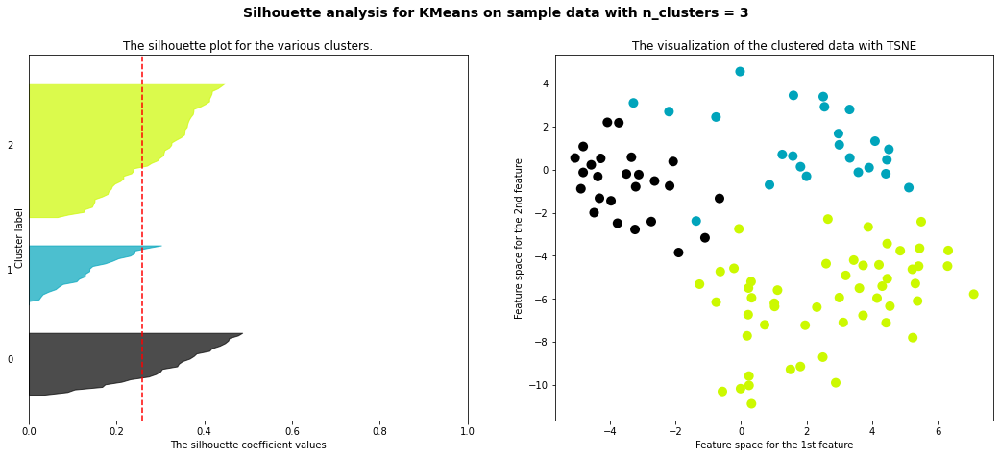

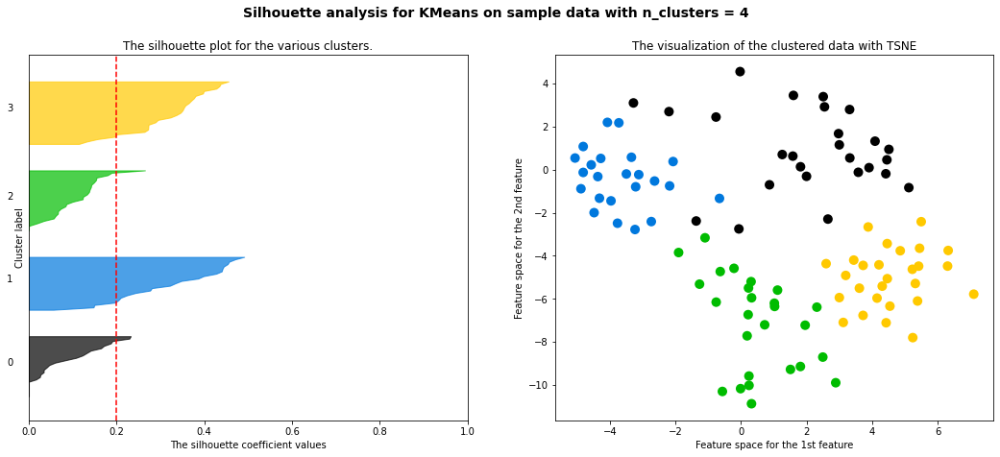

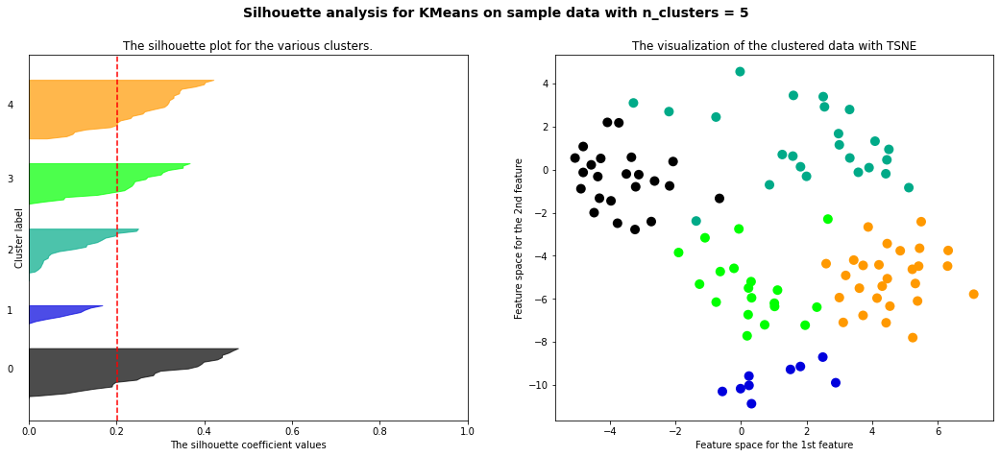

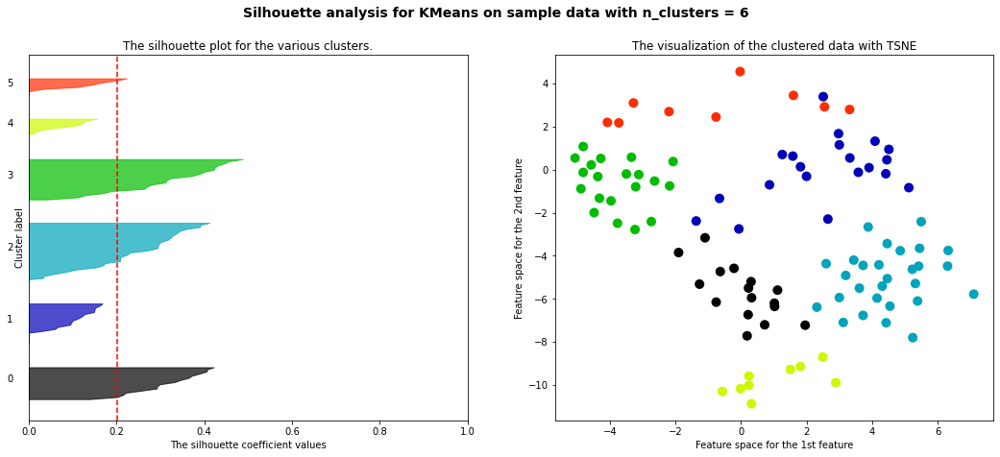

In [23]:
siluette_check(vals, "KMeans")

Согласно критерию силуэта наилучшего разбиения удается добиться при 3 кластерах, что мы подтвердили и ранее

Counter({2: 53, 0: 25, 1: 24})


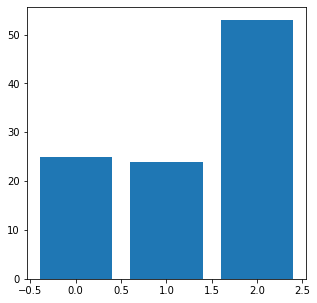

In [24]:
# Подсчитаем количество временных рядов в каждом кластере
draw_counter_bar(km_preds)

Выбивается явно один лидер по значениям

Наблюдаем перекос данных во втором кластере

In [25]:
# Отобразим кластеры на карте
import folium
from matplotlib import colors
from matplotlib import image as pltimg

In [26]:
# Массив названий цветов
color_names = ['blue', 'green', 'red', 'purple', 'cyan', 'orange', 'black']
# Перевод в шестнадцатиричную кодировку цвета
color_hex = [colors.to_hex(j) for j in color_names]

KMeans clustering


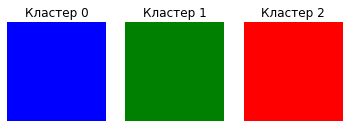

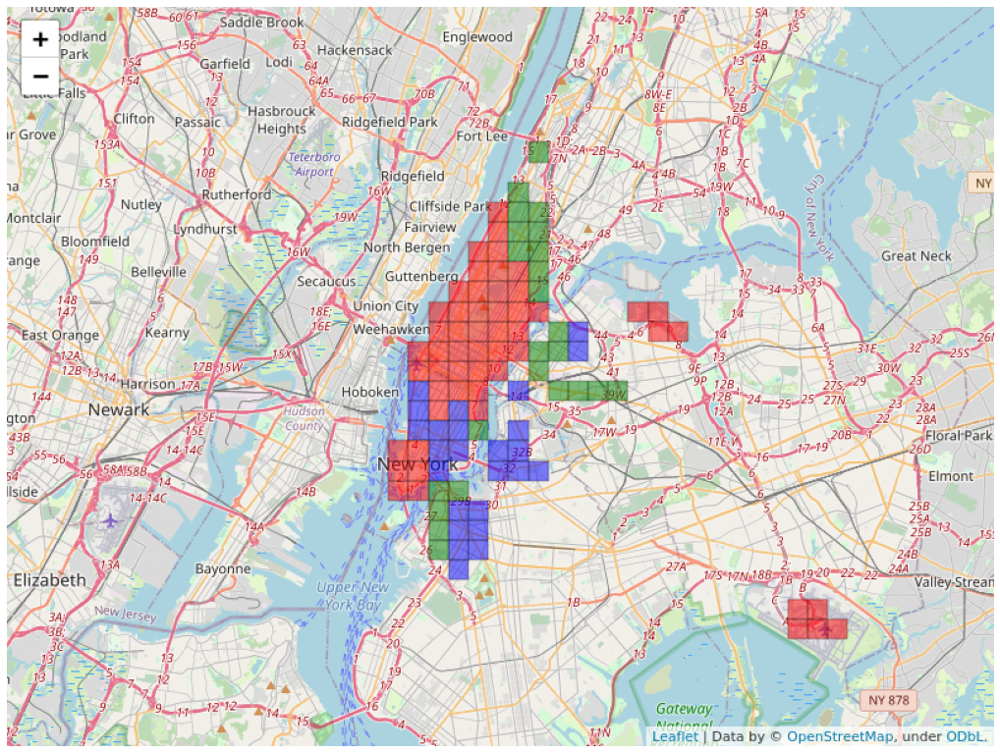

In [27]:
print("KMeans clustering")
draw_save_map(km_preds, "map_4_3_1")

Можно сделать вывод, что поездки из центра и из аэропорта образуют отдельный кластер.
В то же время явно выражаются поездки с севера и юга Манхеттена

#### Кластеризация методом EM.
Воспользуемся вероятностным подходом и гипотезой о том, что наши данные получились из разных распределений

In [28]:
# Инициализируем количество кластеров
num_of_clusters = 3

In [29]:
em_model = GaussianMixture(n_components=num_of_clusters, covariance_type='diag', random_state=random_state)
em_preds = em_model.fit_predict(vals)

Counter({2: 52, 1: 26, 0: 24})


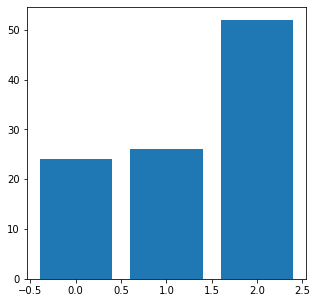

In [30]:
# Подсчитаем количество временных рядов в каждом кластере
draw_counter_bar(em_preds)

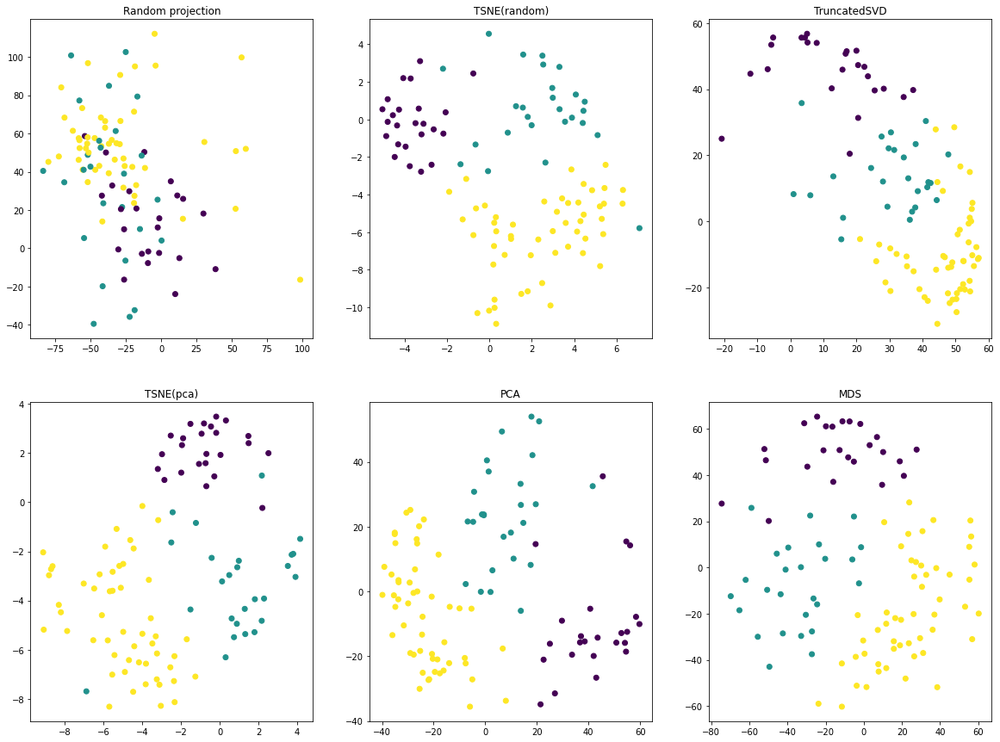

In [31]:
decrease_dimension(vals, num_of_components, random_state, em_preds)

For n_clusters = 2 The average silhouette_score is : 0.2554817172728114
For n_clusters = 3 The average silhouette_score is : 0.24153744072996036
For n_clusters = 4 The average silhouette_score is : 0.19771383258207365
For n_clusters = 5 The average silhouette_score is : 0.18896597841713375
For n_clusters = 6 The average silhouette_score is : 0.15055066699137462


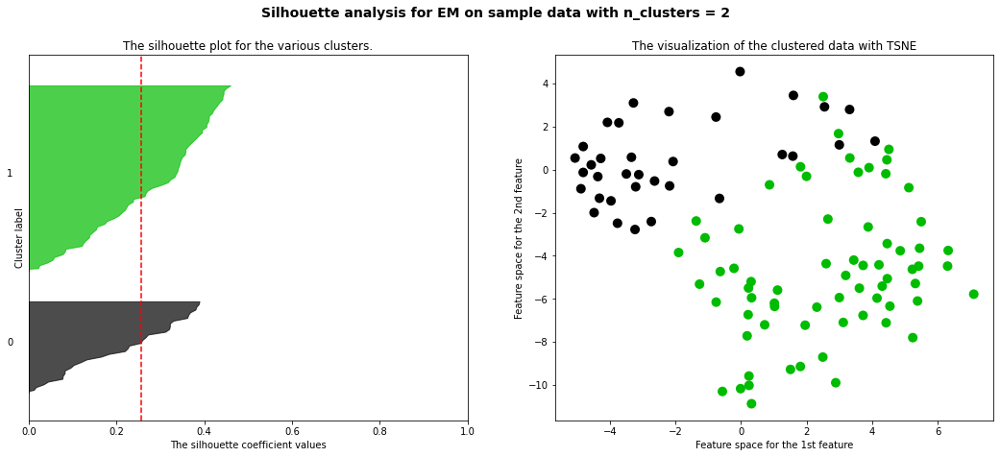

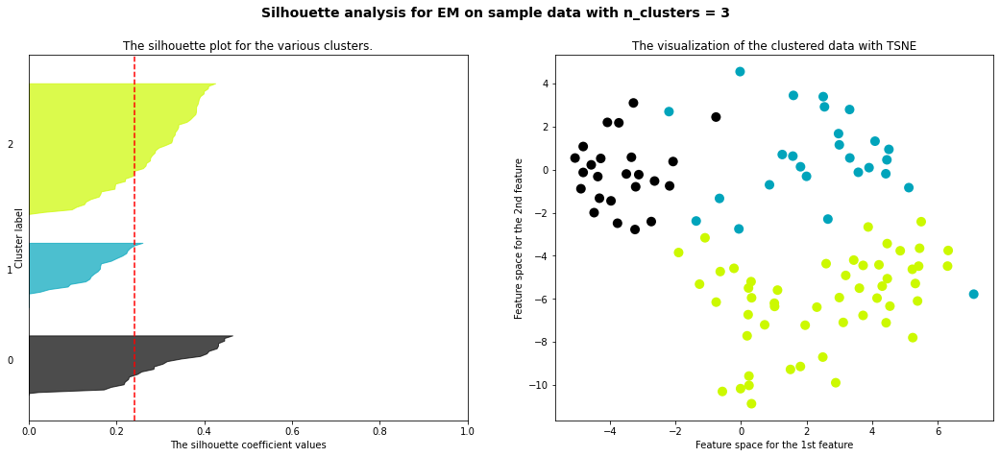

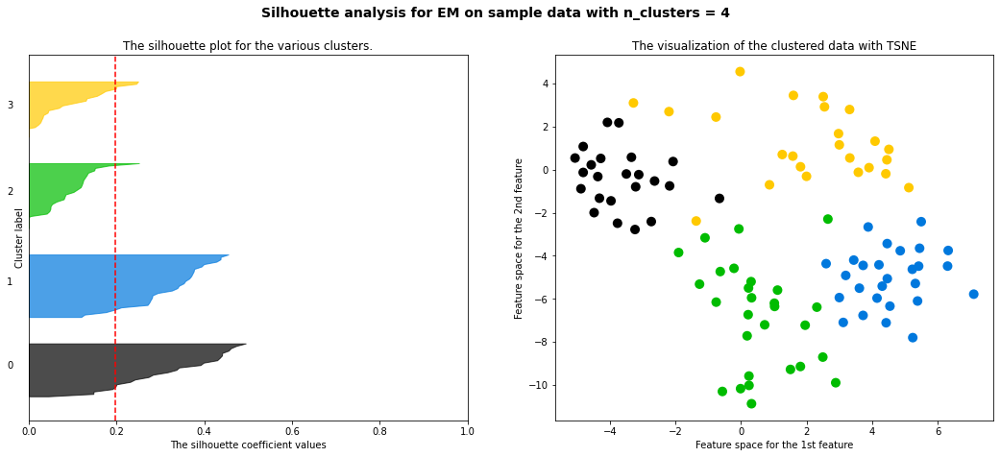

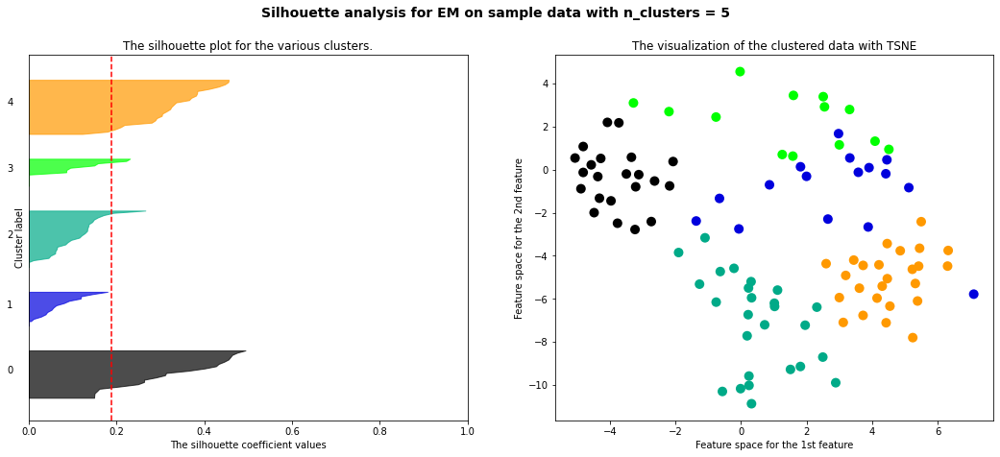

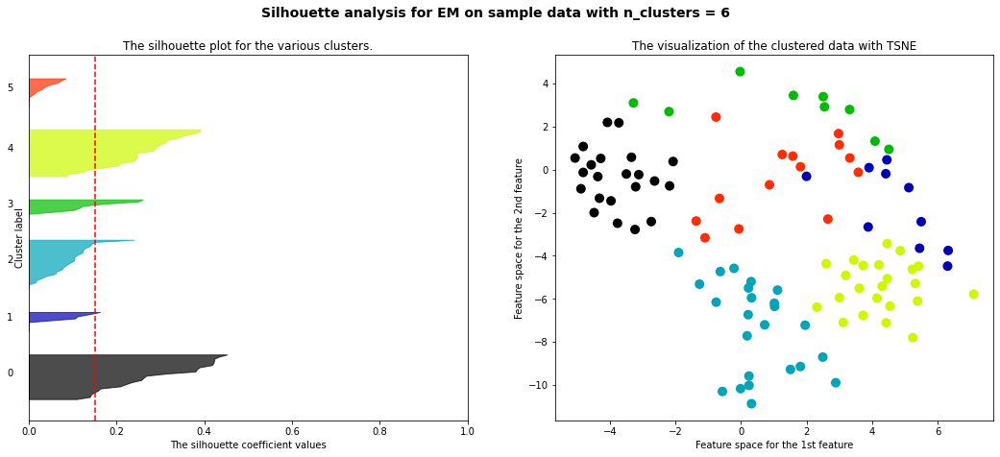

In [32]:
siluette_check(vals, "EM")

Уже имеем небольшое расхождение, для EM алгоритма согласно критерию силуэта оптимальным является всего 2 кластера

EM clustering


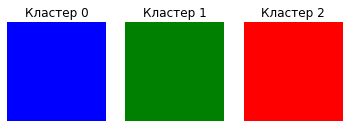

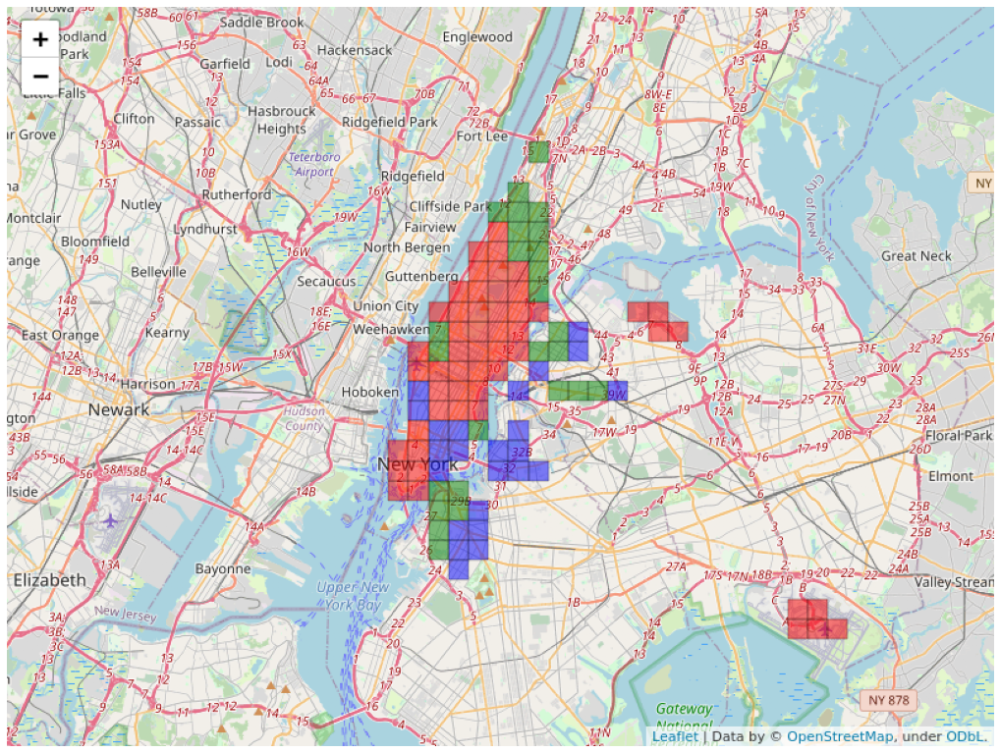

In [33]:
print("EM clustering")
draw_save_map(em_preds, "map_4_3_2")

#### Кластирезация методом DBSCAN на основе плотности.
Попробуем оценить количество кластеров на основе плотности. 
В отличие от предыдущих методов, DBSCAN не требует явного задания количества кластеров, однако требует задания двух других параметров - eps и min_points.

Попробуем оценить оптимальное значение eps

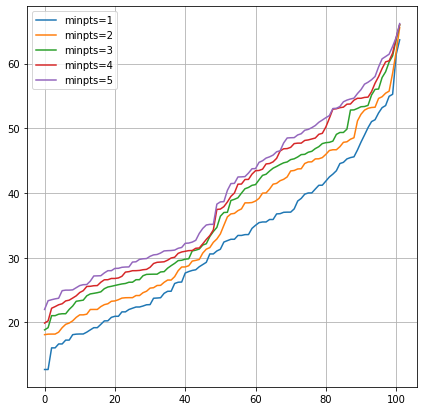

In [34]:
fig, ax = plt.subplots(figsize=(7,7))

for i in range(1, 6):
    nn = NearestNeighbors(n_neighbors=i)
    nn.fit(vals)
    dist, _ = nn.kneighbors()
    dist_last = dist[:,-1]
    dist_last = np.sort(dist_last)
    plt.plot(dist_last, label='minpts=' + str(i))
    

plt.legend()
plt.grid()

In [35]:
dbscan_model = DBSCAN(eps=27, 
                      min_samples=2)

dbscan_preds = dbscan_model.fit_predict(vals)
labels = dbscan_model.labels_

# Объекты с индексом -1 - есть индексы "выбросных" кластеров
print(np.unique(labels))
print(f"Количество получившихся кластеров в данных: {len(np.unique(labels))}")

print(pd.Series(labels).value_counts())

[-1  0  1]
Количество получившихся кластеров в данных: 3
-1    62
 1    23
 0    17
dtype: int64


Counter({-1: 62, 1: 23, 0: 17})


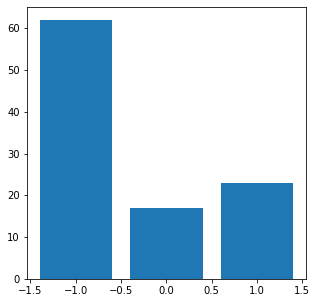

In [36]:
# Подсчитаем количество временных рядов в каждом кластере
draw_counter_bar(dbscan_preds)

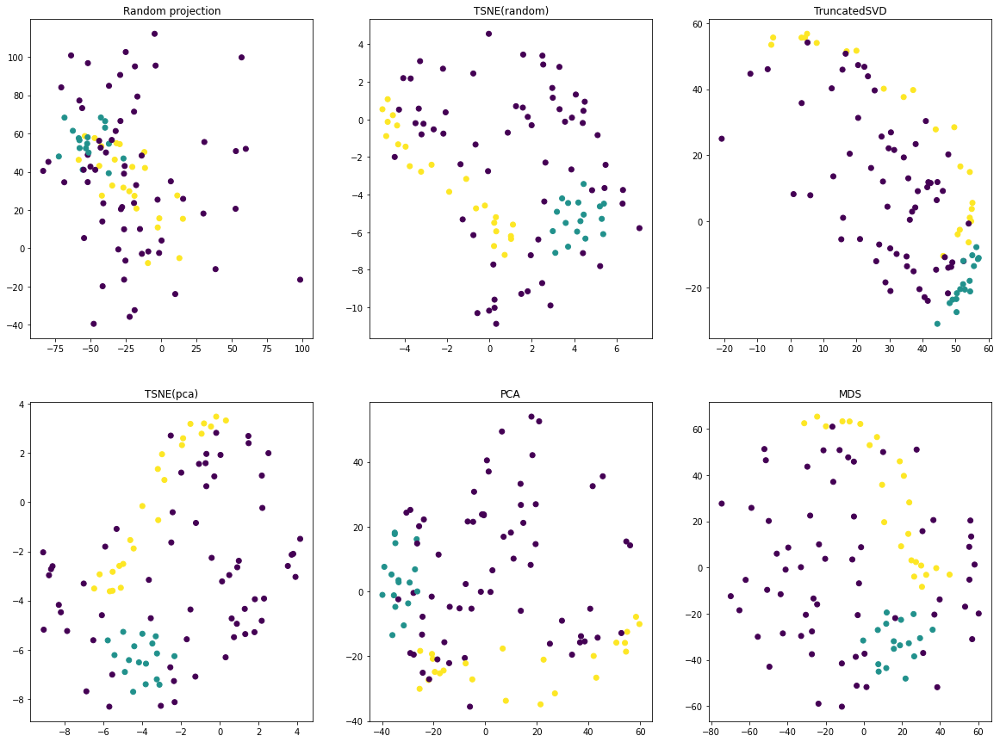

In [37]:
decrease_dimension(vals, num_of_components, random_state, dbscan_preds)

DBScan clustering


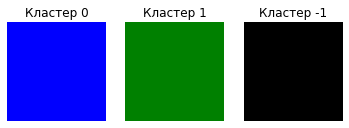

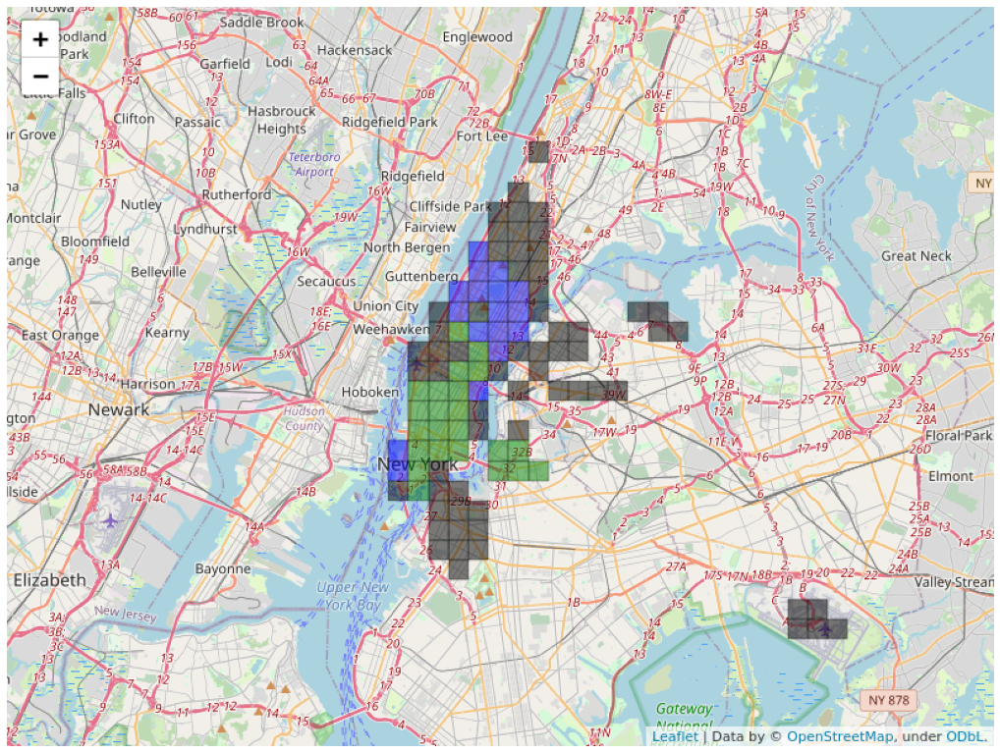

In [38]:
print("DBScan clustering")
draw_save_map(dbscan_preds, "map_4_3_3")

Трудно подобрать параметры eps и min-pts, чтобы алгоритм давал адекватное количество кластеров, а также делал их сбалансированными. Оттого не будем далее использовать данный метод в исследовании

#### Агломеративно-иерархическая кластеризация (AGH)

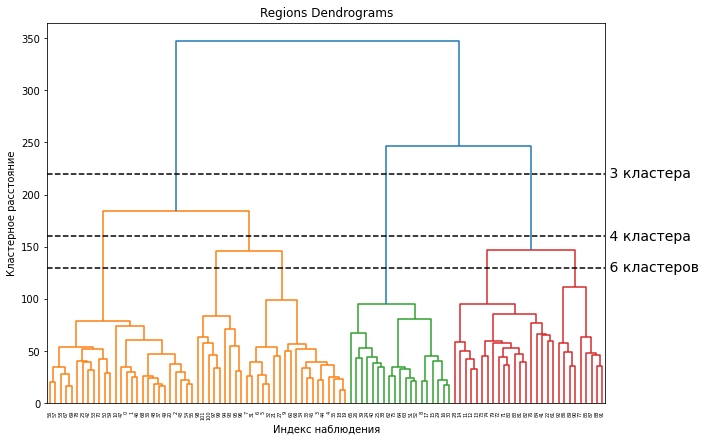

In [39]:
# Оценим возможное количество кластеров при помощи дендрограмм
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(10, 7))
plt.title("Regions Dendrograms")

# Метод связывания кластеров - метод Варда - выбирает и объединяет два
# кластера так, чтобы прирост дисперсии внутри кластеров был
# минимальным. Часто этот критерий приводит к получению кластеров
# относительно одинакового размера, что нам полностью удовлетворяет
dend = shc.dendrogram(shc.linkage(vals, method='ward'))
ax = plt.gca()
bounds = ax.get_xbound()

plt.xlabel("Индекс наблюдения")
plt.ylabel("Кластерное расстояние")

ax.plot(bounds, [220, 220], '--', c='k')
ax.plot(bounds, [160, 160], '--', c='k')
ax.plot(bounds, [130, 130], '--', c='k')
ax.text(bounds[1], 220, ' 3 кластера', va='center', fontdict={'size': 14})
ax.text(bounds[1], 160, ' 4 кластера', va='center', fontdict={'size': 14})
ax.text(bounds[1], 130, ' 6 кластеров', va='center', fontdict={'size': 14})

plt.show()

Судя по агломеративной кластеризации рациональнее производить разбиение по 3 или 4 кластерам.  

In [40]:
# Инициализируем количество кластеров
num_of_clusters = 3

In [41]:
AGH_model = AgglomerativeClustering(n_clusters=num_of_clusters, affinity='euclidean', linkage='ward')
AGH_preds = AGH_model.fit_predict(vals)

Counter({0: 55, 1: 28, 2: 19})


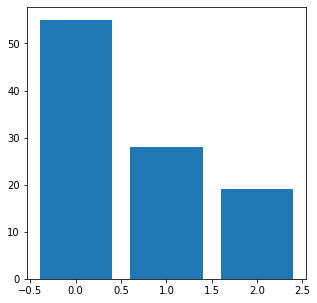

In [42]:
# Подсчитаем количество временных рядов в каждом кластере
draw_counter_bar(AGH_preds)

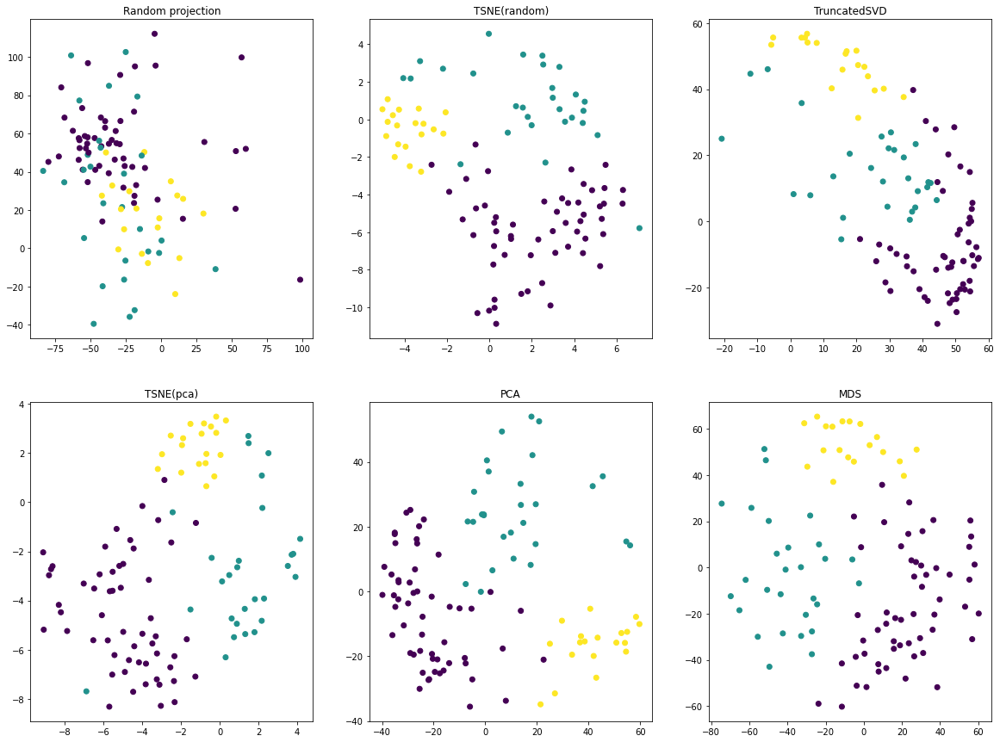

In [43]:
decrease_dimension(vals, num_of_components, random_state, AGH_preds)

For n_clusters = 2 The average silhouette_score is : 0.22908892949752693
For n_clusters = 3 The average silhouette_score is : 0.23894339144688662
For n_clusters = 4 The average silhouette_score is : 0.1805403671334325
For n_clusters = 5 The average silhouette_score is : 0.18773621214328237
For n_clusters = 6 The average silhouette_score is : 0.19956193576613607


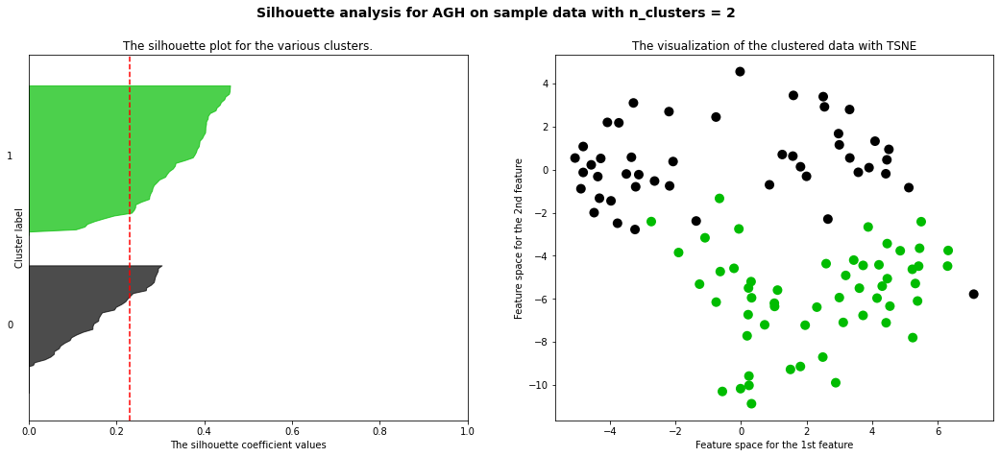

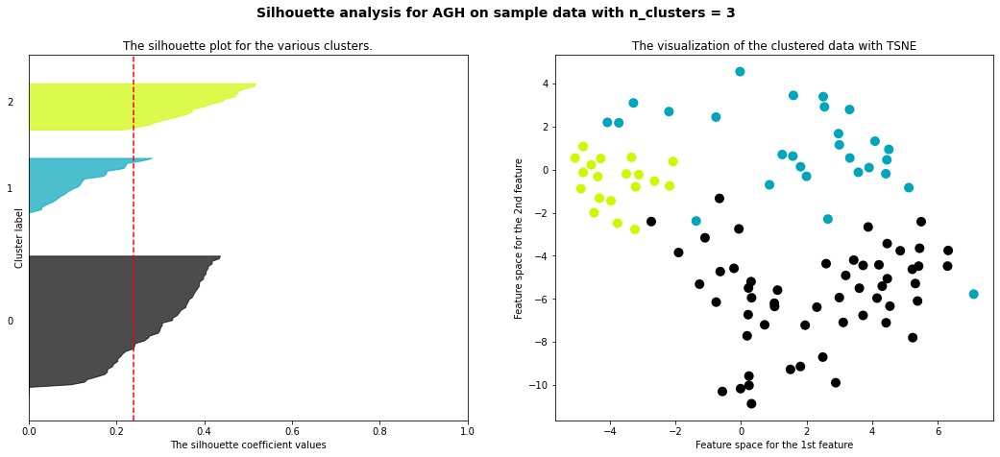

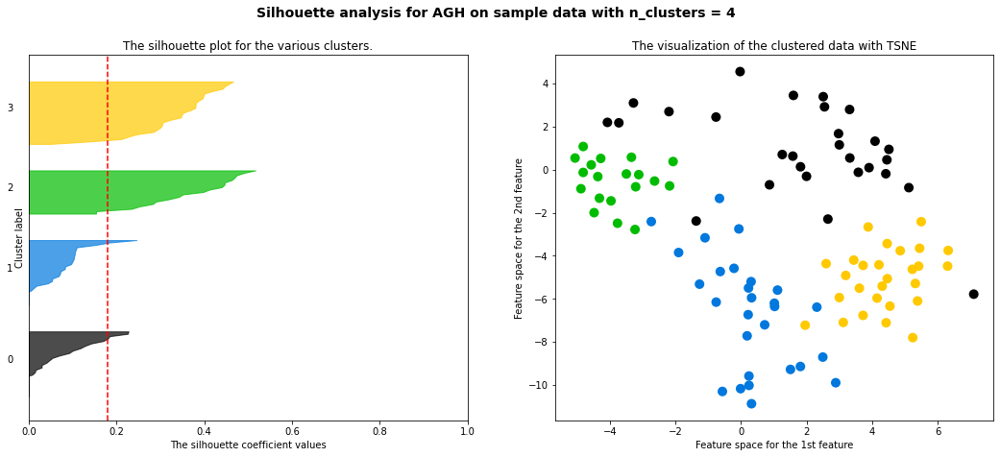

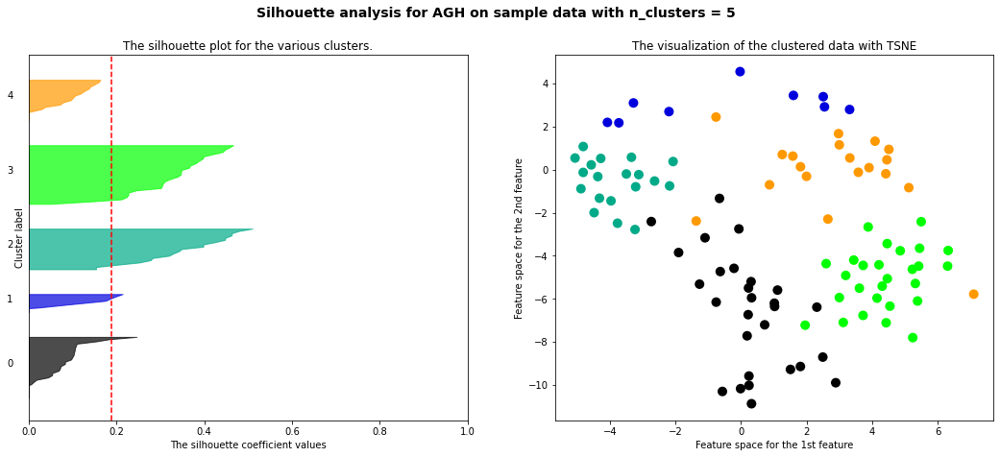

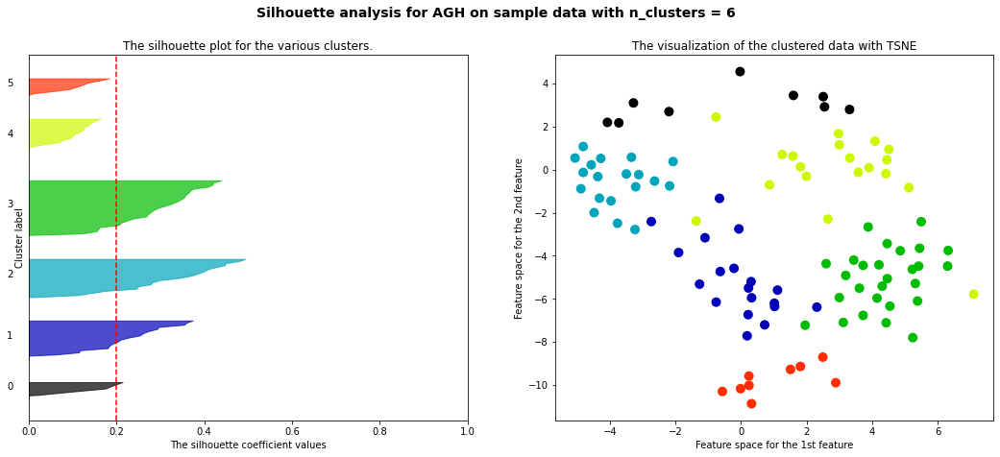

In [44]:
siluette_check(vals, "AGH")

Критерий силуэта предлагает разбивать по 3 кластерам

Aglomeraitve clustering


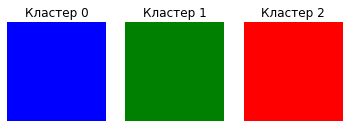

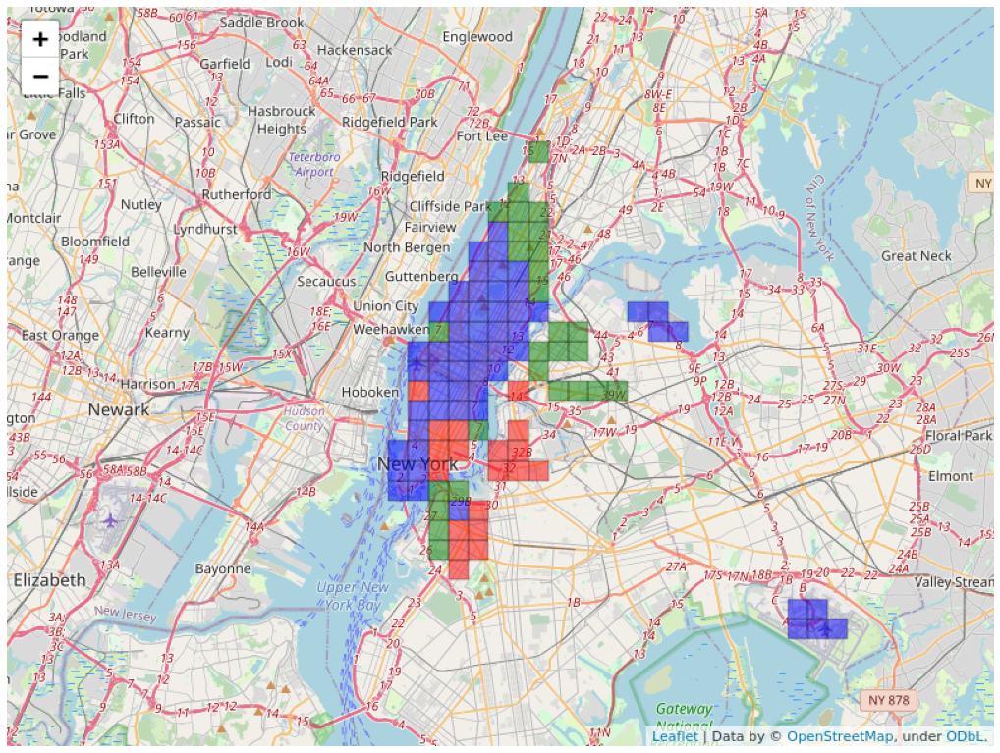

In [45]:
print("Aglomeraitve clustering")
draw_save_map(AGH_preds, "map_4_3_4")

KMeans clustering


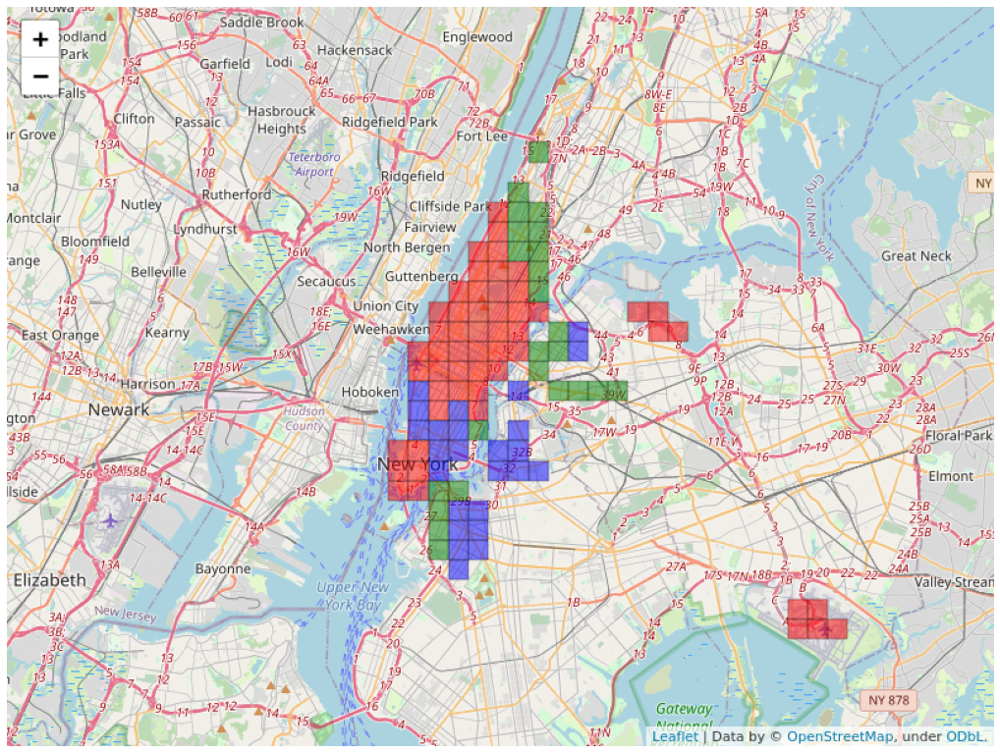

In [46]:
print("KMeans clustering")
# Печатаем
plt.figure(figsize=(18, 15))
map_image = pltimg.imread("map_4_3_1.png")
plt.imshow(map_image)
plt.axis('off')
plt.show()

EM clustering


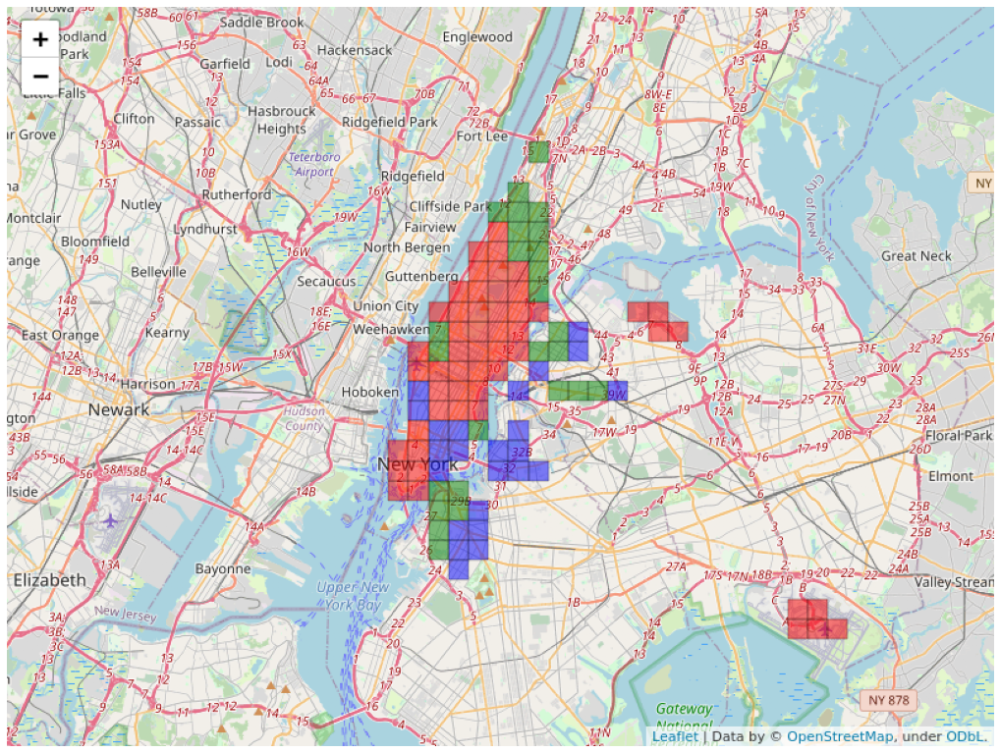

In [47]:
print("EM clustering")
# Печатаем
plt.figure(figsize=(18, 15))
map_image = pltimg.imread("map_4_3_2.png")
plt.imshow(map_image)
plt.axis('off')
plt.show()

Примем в качестве модели кластеризации - KMeans. На мой взгляд, дает наиболее плотные кластеры

#### Разметка регионов временных рядов по кластерам (по агломеративной кластеризации).

In [55]:
reg_info = dec_apr_data.iloc[:, :5]
reg_info['cluster'] = km_preds
reg_info.head()

,region,west,east,south,north,cluster
0,1075,-74.022246,-74.011135,40.697437,40.705825,2
1,1076,-74.022246,-74.011135,40.705825,40.714213,2
2,1077,-74.022246,-74.011135,40.714213,40.722601,2
3,1125,-74.011135,-74.000023,40.697437,40.705825,2
4,1126,-74.011135,-74.000023,40.705825,40.714213,2


In [56]:
reg_info.shape

(102, 6)

In [57]:
# Итоговый датасет
dec_apr_data.head()

,region,west,east,south,north,2015-12-01 00:00:00,2015-12-01 01:00:00,2015-12-01 02:00:00,2015-12-01 03:00:00,2015-12-01 04:00:00,...,2016-04-30 15:00:00,2016-04-30 16:00:00,2016-04-30 17:00:00,2016-04-30 18:00:00,2016-04-30 19:00:00,2016-04-30 20:00:00,2016-04-30 21:00:00,2016-04-30 22:00:00,2016-04-30 23:00:00,type
0,1075,-74.022246,-74.011135,40.697437,40.705825,19.0,16.0,8.0,3.0,2.0,...,145.0,162.0,142.0,157.0,121.0,107.0,91.0,100.0,92.0,0
1,1076,-74.022246,-74.011135,40.705825,40.714213,43.0,22.0,19.0,12.0,12.0,...,299.0,214.0,234.0,223.0,209.0,208.0,155.0,97.0,118.0,0
2,1077,-74.022246,-74.011135,40.714213,40.722601,26.0,12.0,3.0,5.0,3.0,...,147.0,112.0,111.0,124.0,145.0,99.0,108.0,85.0,63.0,0
3,1125,-74.011135,-74.000023,40.697437,40.705825,76.0,29.0,9.0,7.0,7.0,...,91.0,75.0,97.0,111.0,101.0,107.0,115.0,100.0,86.0,0
4,1126,-74.011135,-74.000023,40.705825,40.714213,91.0,71.0,21.0,17.0,21.0,...,287.0,264.0,332.0,339.0,345.0,290.0,318.0,217.0,284.0,0


In [58]:
# Сохраним в отдельный файл
reg_info.to_csv('reg_info.csv', sep=',', header=True, index=False)

In [59]:
# Добавим нумерацию кластеров
dec_apr_data['type'] = km_preds

In [60]:
dec_apr_data

,region,west,east,south,north,2015-12-01 00:00:00,2015-12-01 01:00:00,2015-12-01 02:00:00,2015-12-01 03:00:00,2015-12-01 04:00:00,...,2016-04-30 15:00:00,2016-04-30 16:00:00,2016-04-30 17:00:00,2016-04-30 18:00:00,2016-04-30 19:00:00,2016-04-30 20:00:00,2016-04-30 21:00:00,2016-04-30 22:00:00,2016-04-30 23:00:00,type
0,1075,-74.022246,-74.011135,40.697437,40.705825,19.0,16.0,8.0,3.0,2.0,...,145.0,162.0,142.0,157.0,121.0,107.0,91.0,100.0,92.0,2
1,1076,-74.022246,-74.011135,40.705825,40.714213,43.0,22.0,19.0,12.0,12.0,...,299.0,214.0,234.0,223.0,209.0,208.0,155.0,97.0,118.0,2
2,1077,-74.022246,-74.011135,40.714213,40.722601,26.0,12.0,3.0,5.0,3.0,...,147.0,112.0,111.0,124.0,145.0,99.0,108.0,85.0,63.0,2
3,1125,-74.011135,-74.000023,40.697437,40.705825,76.0,29.0,9.0,7.0,7.0,...,91.0,75.0,97.0,111.0,101.0,107.0,115.0,100.0,86.0,2
4,1126,-74.011135,-74.000023,40.705825,40.714213,91.0,71.0,21.0,17.0,21.0,...,287.0,264.0,332.0,339.0,345.0,290.0,318.0,217.0,284.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97,2068,-73.800014,-73.788903,40.638719,40.647108,96.0,17.0,4.0,0.0,2.0,...,156.0,150.0,186.0,130.0,140.0,119.0,129.0,132.0,134.0,2
98,2069,-73.800014,-73.788903,40.647108,40.655496,16.0,4.0,1.0,0.0,0.0,...,14.0,15.0,17.0,8.0,5.0,11.0,16.0,21.0,10.0,2
99,2118,-73.788903,-73.777791,40.638719,40.647108,246.0,104.0,28.0,50.0,23.0,...,215.0,205.0,228.0,154.0,158.0,232.0,158.0,198.0,181.0,2
100,2119,-73.788903,-73.777791,40.647108,40.655496,31.0,5.0,0.0,0.0,1.0,...,76.0,44.0,108.0,43.0,59.0,50.0,81.0,23.0,74.0,2


In [61]:
# Выберем характерные ячейки по минимальному евклидову расстоянию до центров кластеризации.
target_cells = dict()
for tp in set(km_preds):
    cluster_center = km_model.cluster_centers_[tp]
    type_data = dec_apr_data[dec_apr_data.type == tp]
    min_dist = float('inf')

    for index, row in type_data.iterrows():
        if np.linalg.norm(cluster_center - np.array(row.iloc[5:-1])) < min_dist:
            target_cells[tp] = int(row.region)

In [62]:
# !mkdir dumps && cd dumps
# !touch target_cells.joblib
# Создадим файл "подкачки" на будущее
dump(target_cells, 'dumps/target_cells.joblib')

['dumps/target_cells.joblib']

In [63]:
for i in target_cells:
    print('Кластер {} - регион {}'.format(i, target_cells[i]))

Кластер 0 - регион 1533
Кластер 1 - регион 1630
Кластер 2 - регион 2168


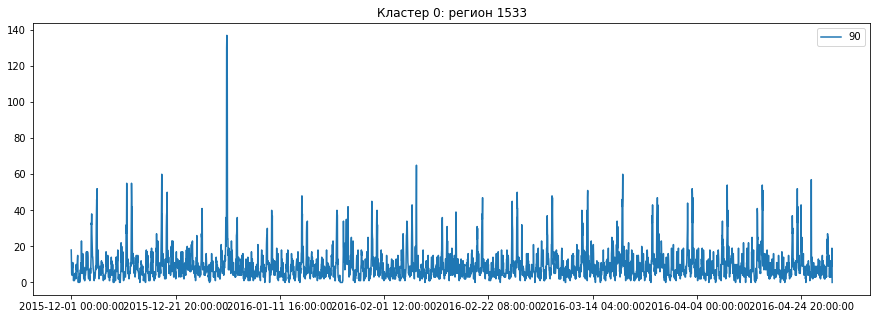

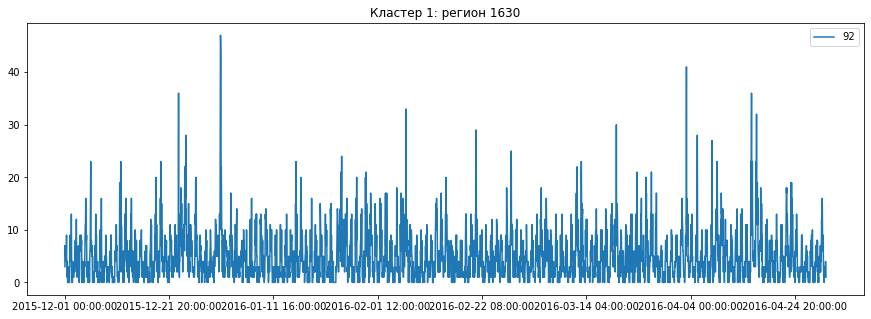

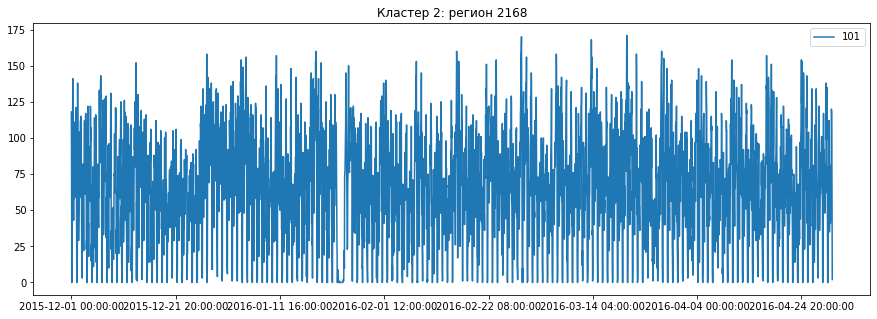

In [64]:
# Взглянем на получившиеся временные ряды
for i in target_cells:
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_apr_data[dec_apr_data.region==target_cells[i]].iloc[:, 5:].transpose().plot(ax=ax)
    plt.title('Кластер {}: регион {}'.format(i, target_cells[i]))
    plt.show()

Действительно, налицо различие во временных рядах в плане частоты поездок

### Прогнозирование временного ряда при помощи авторегрессии
Подбор параметров модели семейства ARIMA

По аналогии с прошлым заданием для учёта недельной сезонности используем регрессионные признаки следующего вида:  
__"Вставить формулу синусов"__  

Примем К = 20. Также добавим категориальные признаки месяца, дня недели, логарифм количества дней с прошедшего праздника

In [65]:
import holidays
from sklearn.preprocessing import OneHotEncoder
from sklearn import linear_model
from statsmodels import api as sm
from itertools import product
from joblib import dump, load

In [66]:
# Количество дней после ближайшего прошедшего праздника.
def day_after_holiday(day):
    ny_holidays = holidays.CountryHoliday('US', state='NY')
    res = 0
    temp_day = day
    while temp_day not in ny_holidays:
        res += 1
        temp_day = temp_day - datetime.timedelta(days=1)
    return res

In [67]:
# Добавление признаков. 
# Модифицирует датафрейм, возвращеет имена колонок с признаками.
def add_features(cell_data, k, counter=1):
    
    # Синусы и косинусы.
    cell_data['const'] = 1
    cell_data['lin'] = np.arange(counter, cell_data.shape[0]+counter)
    real_columns = ['const', 'lin']
    for i in range(1, k+1):
        #year_sin_col = 'year_sin_{}'.format(i)
        #year_cos_col = 'year_cos_{}'.format(i)
        week_sin_col = 'week_sin_{}'.format(i)
        week_cos_col = 'week_cos_{}'.format(i)
        
        #cell_data[year_sin_col] = np.sin(np.array(cell_data['lin'] * 2 * np.pi * i / 8766))
        #cell_data[year_cos_col] = np.cos(np.array(cell_data['lin'] * 2 * np.pi * i / 8766))
        cell_data[week_sin_col] = np.sin(np.array(cell_data['lin'] * 2 * np.pi * i / 168))
        cell_data[week_cos_col] = np.cos(np.array(cell_data['lin'] * 2 * np.pi * i / 168))
        
        #features_columns += [year_sin_col, year_cos_col, week_sin_col, week_cos_col]
        real_columns += [week_sin_col, week_cos_col]
    
    # Дни недели.
    weekdays = ['monday', 'tuesday', 'wednesday', 'thursday', 'friday', 'saturday', 'sunday']
    days = cell_data.index
    days = np.array([i.weekday() + 1 for i in days] + list(range(1, 8)))
    res = OneHotEncoder(sparse=False).fit_transform(days.reshape((-1,1)))[:-7, :]
    for i in range(len(weekdays)):
        cell_data[weekdays[i]] = res[:, i]
    categorical_columns = weekdays
    
    # Месяцы. 
    months_names = ['january', 'february', 'march', 'april', 'may', 'june', 
                'jule', 'august', 'september', 'october', 'november', 'december']
    months = np.array([i.month for i in cell_data.index] + list(range(1, 13)))

    res = OneHotEncoder(sparse=False).fit_transform(months.reshape((-1,1)))[:-12, :]
    for i in range(len(months_names)):
        cell_data[months_names[i]] = res[:, i]
    categorical_columns += months_names
        
 
    # Праздники.
    cell_data['days_after_holidays'] = np.log(np.array([day_after_holiday(i) for i in cell_data.index]) + 1)
    real_columns += ['days_after_holidays']
    
    # Масштабирование.
    #vals = StandardScaler().fit_transform(np.array(cell_data[real_columns]))
    #for i in range(len(real_columns)):
     #   cell_data[real_columns[i]] = vals[:, i]
    
    features_columns = real_columns + categorical_columns
    
    return features_columns

In [68]:
# Обучение модели, добаление предсказаний и остатков в датафрейм. Возвращает модель.
def get_reg_pred(cell_data, features_columns):
    train_data = np.array(cell_data[features_columns])
    train_labels = np.array(cell_data['trips'])
    
    model = linear_model.LinearRegression()
    model.fit(train_data, train_labels)
    
    preds = model.predict(cell_data[features_columns])
    
    cell_data['reg_pred'] = preds
    cell_data['reg_resid'] = cell_data['trips'] - preds
    
    return model

In [69]:
K = 20

In [70]:
dec_apr_data.drop(columns=['type'], inplace=True, errors='ignore')

#### Кластер 0. Анализ временного ряда и первичный подбор параметров модели

In [71]:
cell_data_0 = dec_apr_data[dec_apr_data.region==target_cells[0]].iloc[:, 5:].transpose()
cell_data_0.columns = ['trips']
features_columns_0 = add_features(cell_data_0, K)
reg_model_0 = get_reg_pred(cell_data_0, features_columns_0)
cell_data_0.head()

,trips,const,lin,week_sin_1,week_cos_1,week_sin_2,week_cos_2,week_sin_3,week_cos_3,week_sin_4,...,june,jule,august,september,october,november,december,days_after_holidays,reg_pred,reg_resid
2015-12-01 00:00:00,18.0,1,1,0.037391,0.999301,0.074730,0.997204,0.111964,0.993712,0.149042,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,9.564016,8.435984
2015-12-01 01:00:00,12.0,1,2,0.074730,0.997204,0.149042,0.988831,0.222521,0.974928,0.294755,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,8.843006,3.156994
2015-12-01 02:00:00,5.0,1,3,0.111964,0.993712,0.222521,0.974928,0.330279,0.943883,0.433884,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,8.459488,-3.459488
2015-12-01 03:00:00,6.0,1,4,0.149042,0.988831,0.294755,0.955573,0.433884,0.900969,0.563320,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,8.630355,-2.630355
2015-12-01 04:00:00,4.0,1,5,0.185912,0.982566,0.365341,0.930874,0.532032,0.846724,0.680173,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.791759,9.203924,-5.203924


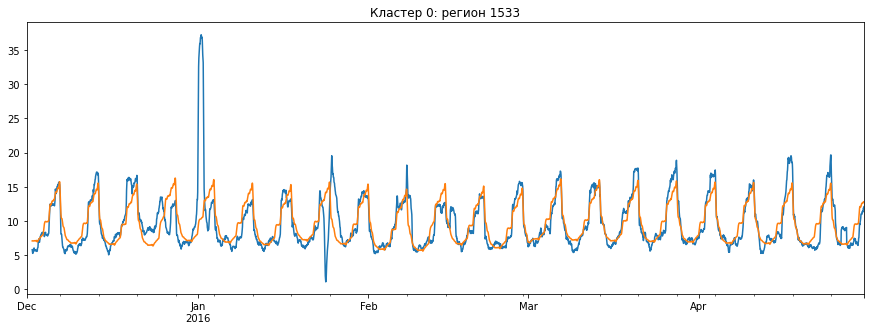

In [72]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_0.trips.rolling(24).mean().plot(ax=ax)
cell_data_0.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 0: регион {}'.format(target_cells[0]))
plt.show()

In [73]:
dump(reg_model_0, 'dumps/reg_model_0.joblib')

['dumps/reg_model_0.joblib']

In [74]:
# Преобразование остатков регрессии
def plot_decompose(cell_data_0, col):
    dec_obj = sm.tsa.seasonal_decompose(cell_data_0[col].dropna())
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_obj.observed.plot(ax=ax)
    plt.title('Observed'.format(i, target_cells[i]))
    plt.show()
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_obj.trend.plot(ax=ax)
    plt.title('Trend'.format(i, target_cells[i]))
    plt.show()
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_obj.seasonal.plot(ax=ax)
    plt.title('Seasonal'.format(i, target_cells[i]))
    plt.show()
    fig, ax = plt.subplots(figsize=(15, 5))
    dec_obj.resid.plot(ax=ax)
    plt.title('Resid'.format(i, target_cells[i]))
    plt.show()

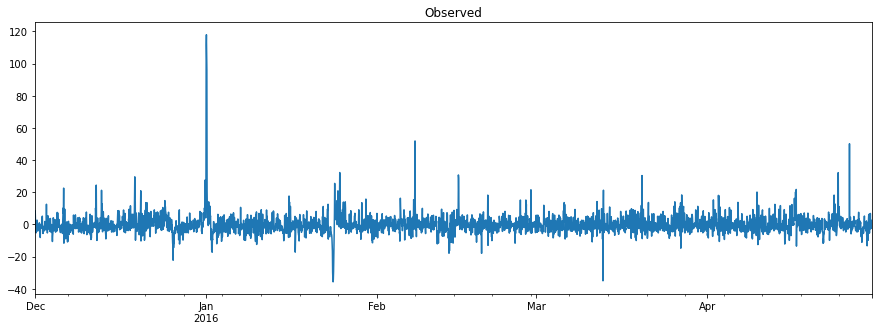

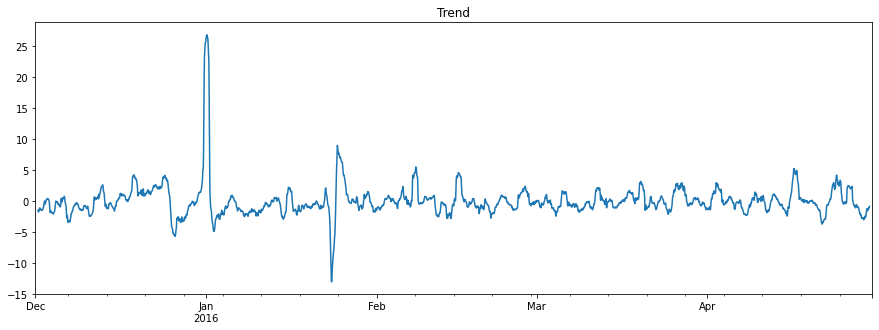

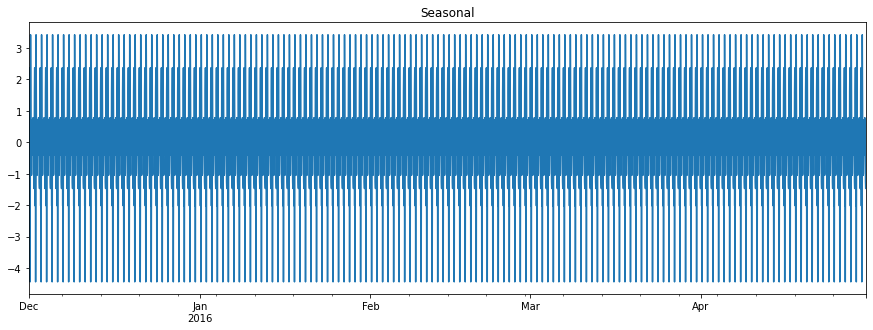

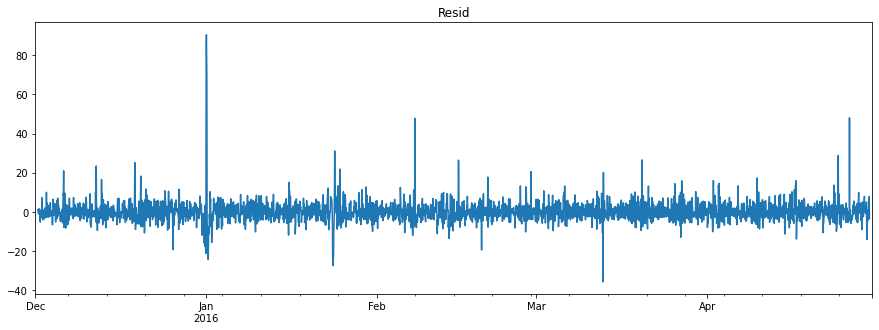

In [75]:
plot_decompose(cell_data_0, 'reg_resid')

In [76]:
# Выполним одно сезонное дифференцирование, затем одно обычное.
cell_data_0['reg_resid_diff'] = cell_data_0.reg_resid - cell_data_0.reg_resid.shift(24)
cell_data_0['reg_resid_diff'] = cell_data_0['reg_resid_diff'] - cell_data_0['reg_resid_diff'].shift(1)

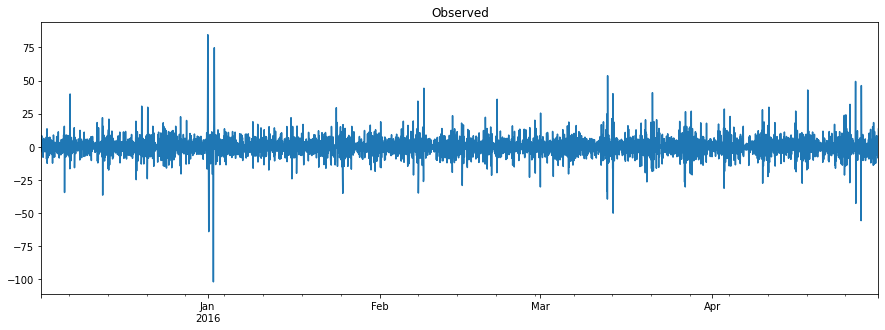

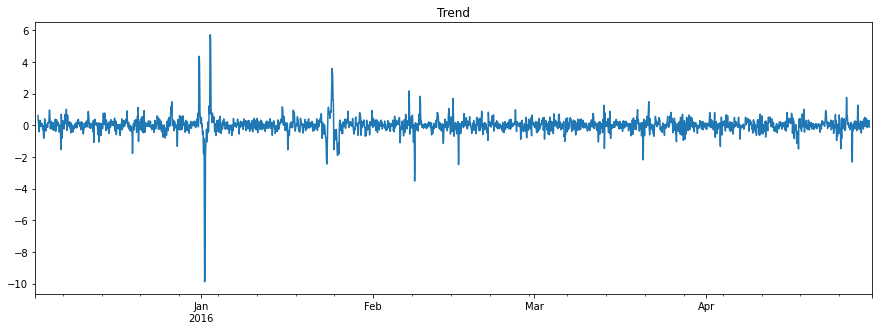

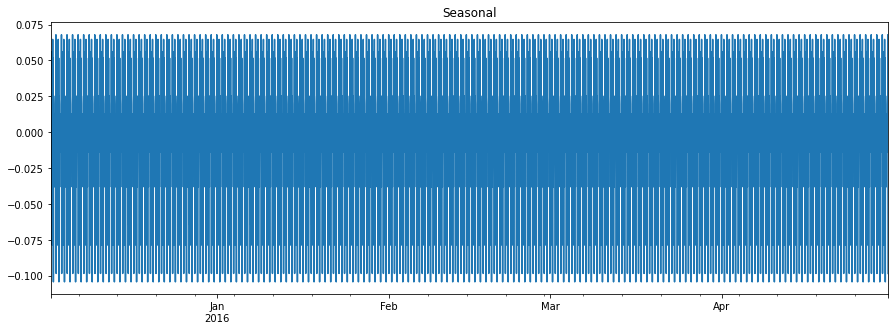

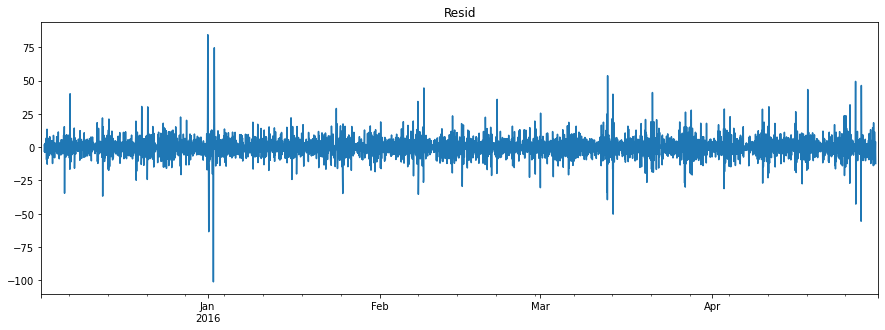

In [77]:
plot_decompose(cell_data_0, 'reg_resid_diff')

In [78]:
# Подберём параметры модели SARIMAX.
d = 1; D = 1

In [79]:
# Построение кореллограмм
def plot_corr(data, lags, cor='acf'):
    fig, ax = plt.subplots(figsize=(15, 5))
    if cor == 'acf':
        sm.graphics.tsa.plot_acf(data.dropna().values.squeeze(), lags=lags, ax=ax)
    elif cor == 'pacf':
        sm.graphics.tsa.plot_pacf(data.dropna().values.squeeze(), lags=lags, ax=ax)
    ax.xaxis.set_ticks(np.arange(0, lags, 10))
    plt.show()

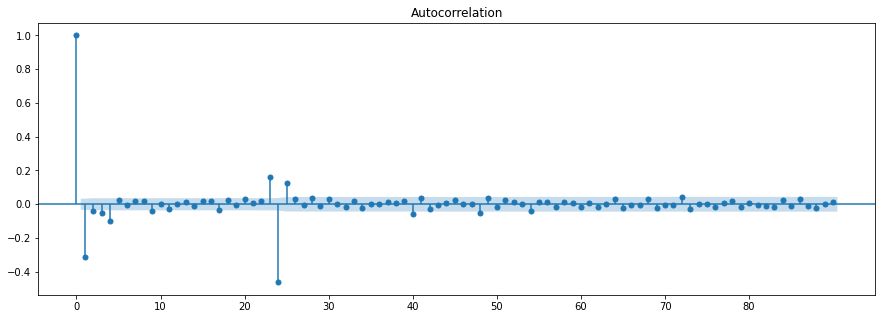

In [80]:
plot_corr(cell_data_0['reg_resid_diff'], 90 , 'acf')

In [81]:
q = 23; Q = 1

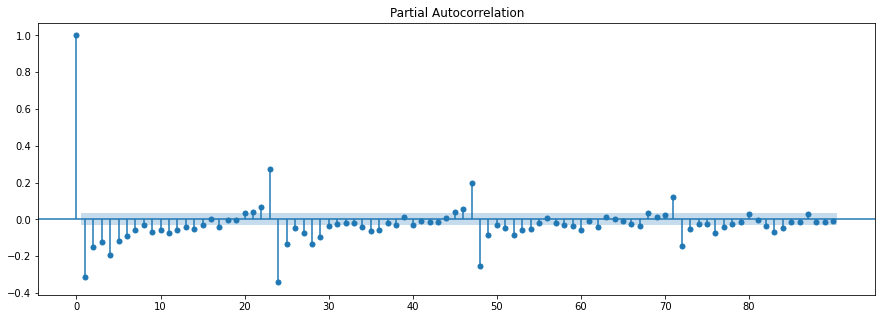

In [82]:
plot_corr(cell_data_0['reg_resid_diff'], 90 , 'pacf')

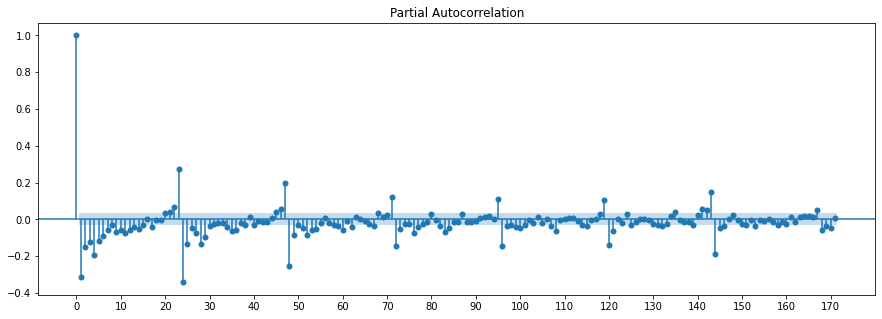

In [83]:
plot_corr(cell_data_0['reg_resid_diff'], 171 , 'pacf')

In [84]:
p = 15; P = 6

In [85]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_0 = product(ps, [d], qs, Ps, [D], Qs)
parameters_0 = list(parameters_0)
len(parameters_0)

5376

#### Кластер 1. Анализ временного ряда и первичный подбор параметров модели

In [86]:
cell_data_1 = dec_apr_data[dec_apr_data.region==target_cells[1]].iloc[:, 5:].transpose()
cell_data_1.columns = ['trips']
features_columns_1 = add_features(cell_data_1, K)
reg_model_1 = get_reg_pred(cell_data_1, features_columns_1)

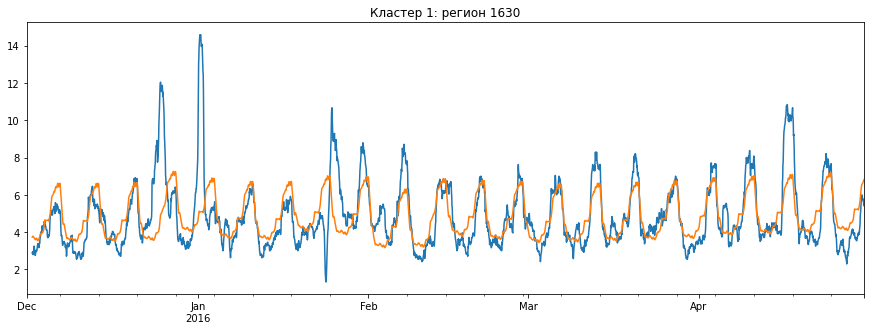

In [87]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_1.trips.rolling(24).mean().plot(ax=ax)
cell_data_1.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 1: регион {}'.format(target_cells[1]))
plt.show()

In [88]:
dump(reg_model_1, 'dumps/reg_model_1.joblib')

['dumps/reg_model_1.joblib']

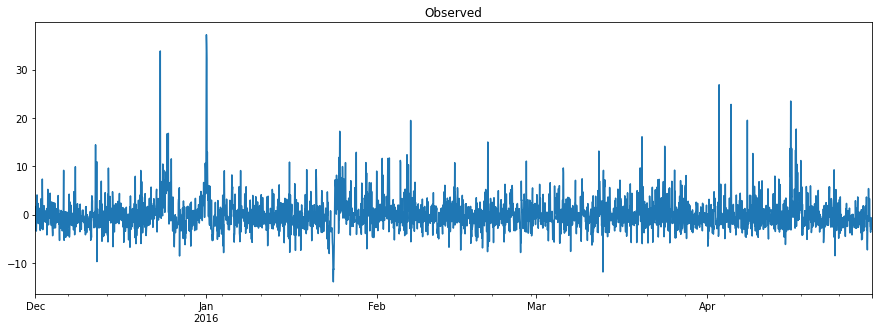

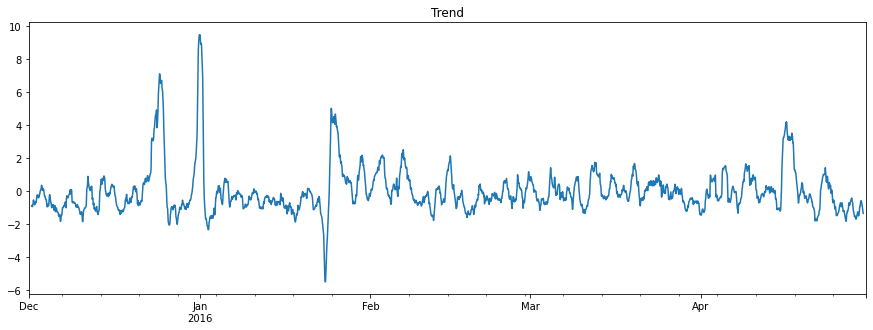

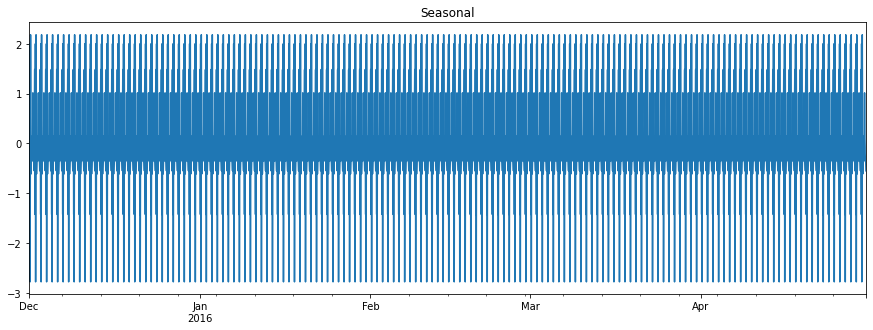

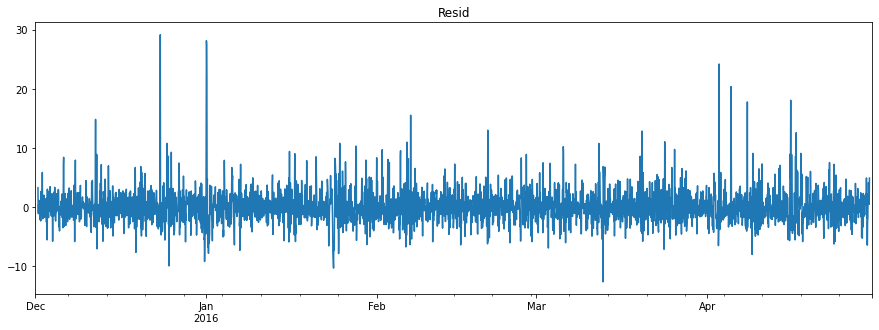

In [89]:
plot_decompose(cell_data_1, 'reg_resid')

In [90]:
cell_data_1['reg_resid_diff'] = cell_data_1.reg_resid - cell_data_1.reg_resid.shift(24)
cell_data_1['reg_resid_diff'] = cell_data_1['reg_resid_diff'] - cell_data_1['reg_resid_diff'].shift(1)

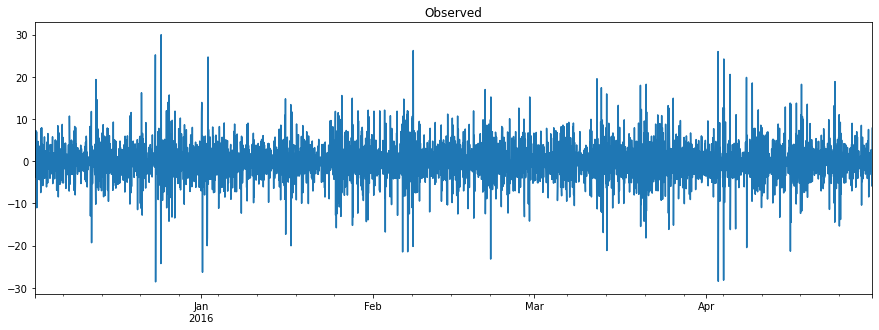

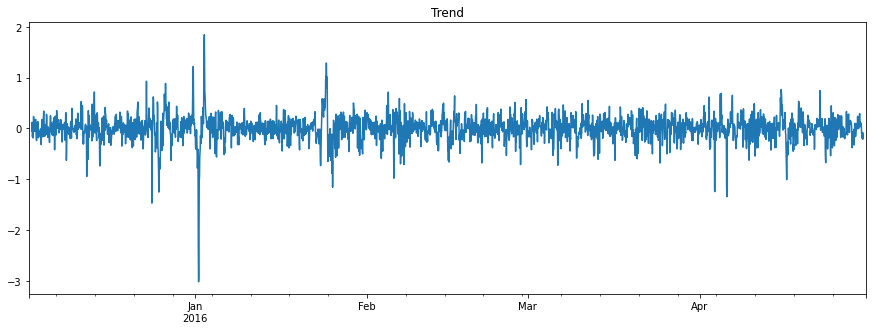

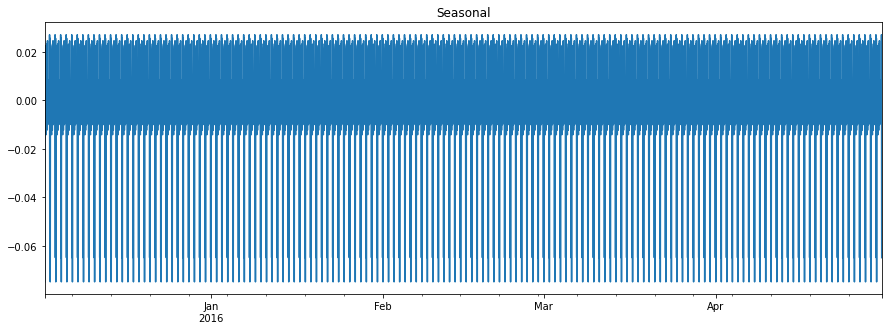

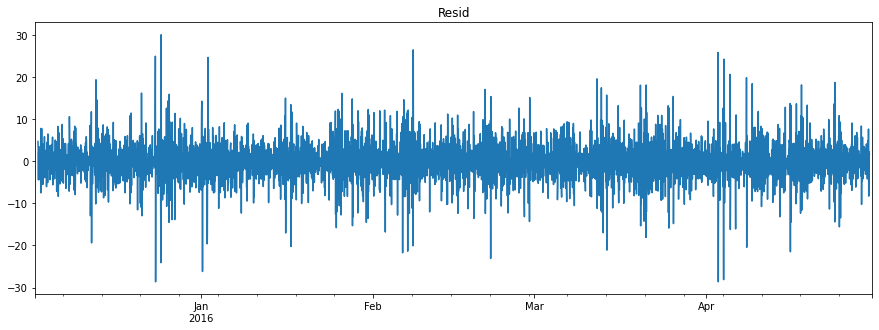

In [91]:
plot_decompose(cell_data_1, 'reg_resid_diff')

In [92]:
d = 1; D = 1

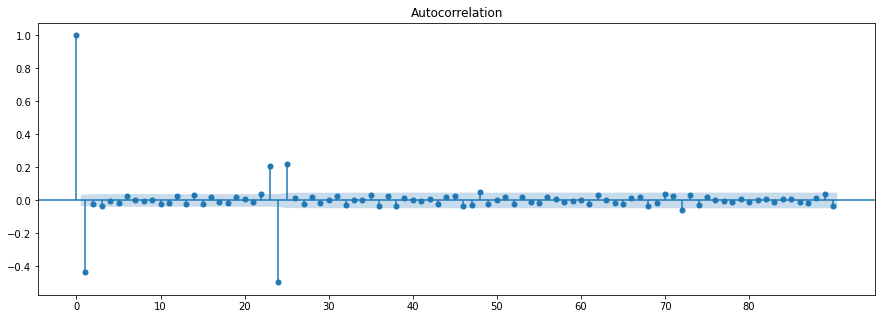

In [93]:
plot_corr(cell_data_1['reg_resid_diff'], 90 , 'acf')

In [94]:
q = 23; Q = 1

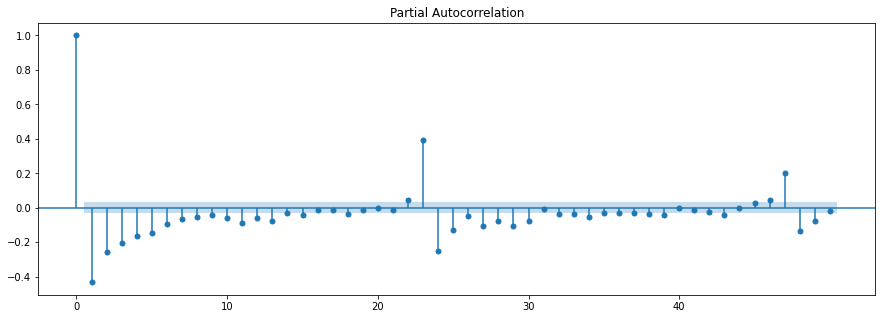

In [95]:
plot_corr(cell_data_1['reg_resid_diff'], 50 , 'pacf')

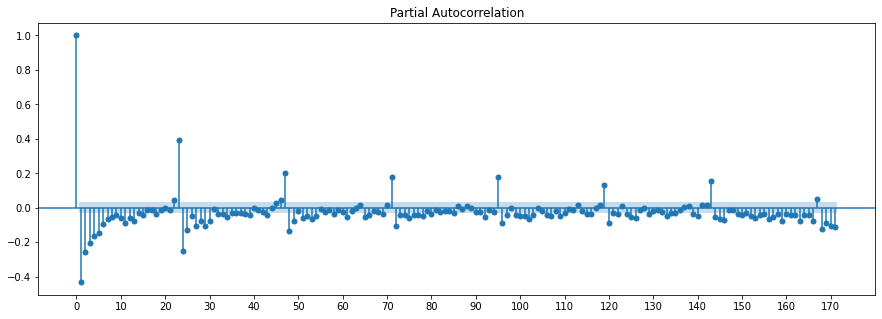

In [96]:
plot_corr(cell_data_1['reg_resid_diff'], 171 , 'pacf')

In [97]:
p = 14; P = 6

In [98]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_1 = product(ps, [d], qs, Ps, [D], Qs)
parameters_1 = list(parameters_1)
len(parameters_1)

5040

#### Кластер 2. Анализ временного ряда и первичный подбор параметров модели

In [99]:
cell_data_2 = dec_apr_data[dec_apr_data.region==target_cells[2]].iloc[:, 5:].transpose()
cell_data_2.columns = ['trips']
features_columns_2 = add_features(cell_data_2, K)
reg_model_2 = get_reg_pred(cell_data_2, features_columns_2)

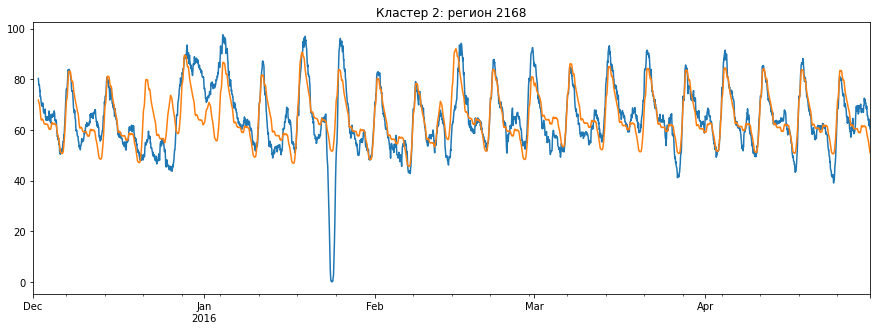

In [100]:
fig, ax = plt.subplots(figsize=(15, 5))
cell_data_2.trips.rolling(24).mean().plot(ax=ax)
cell_data_2.reg_pred.rolling(24).mean().plot(ax=ax)
plt.title('Кластер 2: регион {}'.format(target_cells[2]))
plt.show()

In [101]:
dump(reg_model_2, 'dumps/reg_model_2.joblib')

['dumps/reg_model_2.joblib']

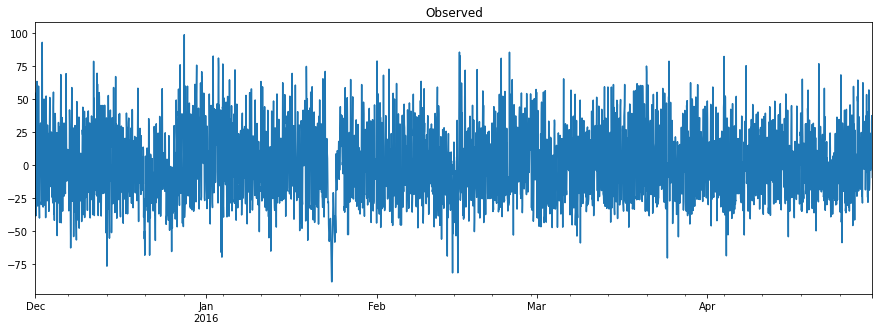

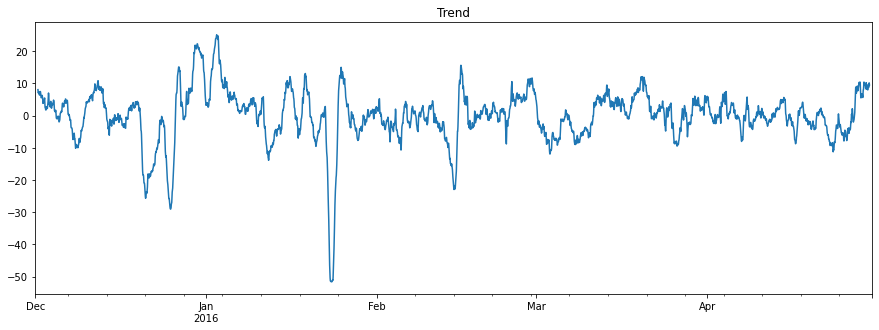

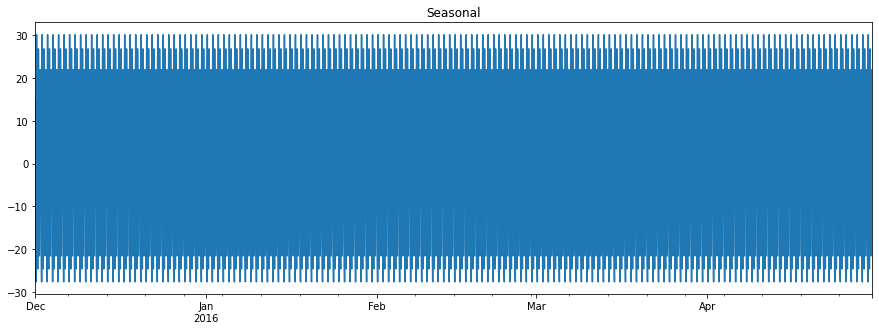

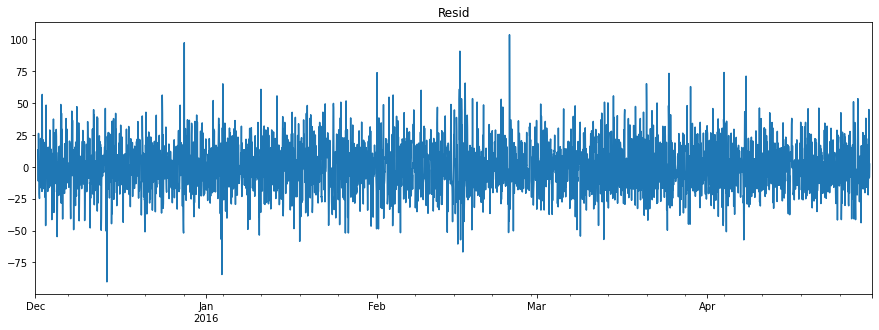

In [102]:
plot_decompose(cell_data_2, 'reg_resid')

In [103]:
cell_data_2['reg_resid_diff'] = cell_data_2.reg_resid - cell_data_2.reg_resid.shift(24)
cell_data_2['reg_resid_diff'] = cell_data_2['reg_resid_diff'] - cell_data_2['reg_resid_diff'].shift(1)

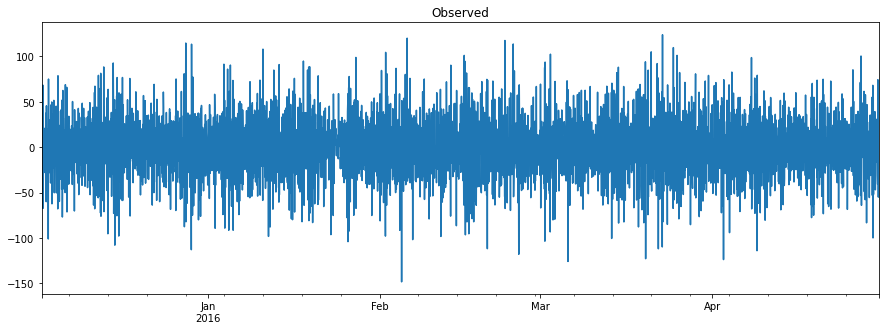

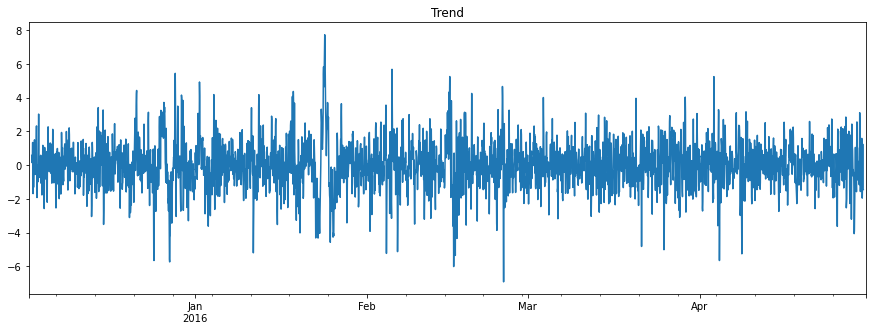

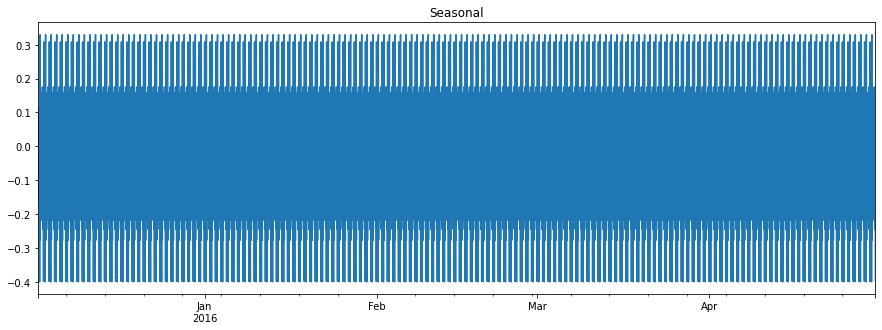

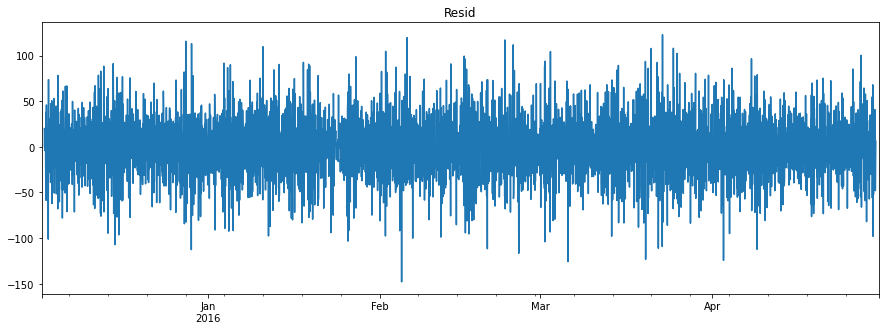

In [104]:
plot_decompose(cell_data_2, 'reg_resid_diff')

In [105]:
d = 1; D = 1

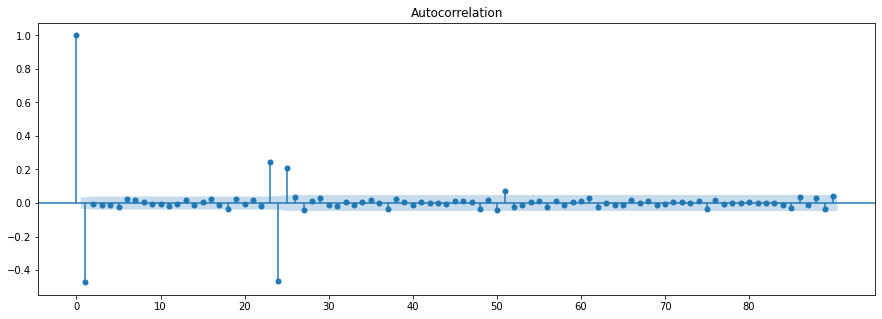

In [106]:
plot_corr(cell_data_2['reg_resid_diff'], 90, 'acf')

In [107]:
q = 23; Q = 1

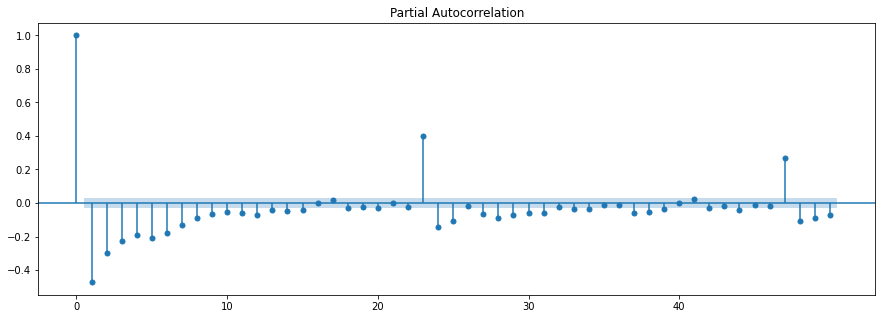

In [108]:
plot_corr(cell_data_2['reg_resid_diff'], 50, 'pacf')

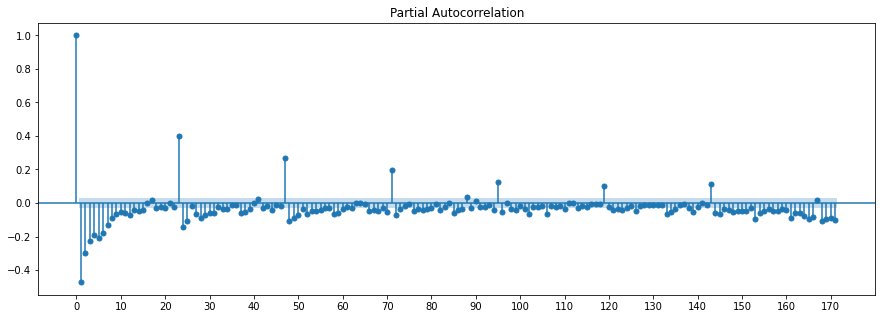

In [109]:
plot_corr(cell_data_2['reg_resid_diff'], 171, 'pacf')

In [110]:
p = 15; P = 7

In [111]:
ps = list(range(p+1))
qs = list(range(q+1))
Ps = list(range(P+1))
Qs = list(range(Q+1))
parameters_2 = product(ps, [d], qs, Ps, [D], Qs)
parameters_2 = list(parameters_2)
len(parameters_2)

6144

### Настройка SARIMAX
Перебирать все варианты параметров не будем, ограничим время перебора циклов.

In [112]:
from joblib import dump
from scipy import stats as sts

#### Кластер 0.

In [113]:
import gc
import tracemalloc
import logging
from sys import getsizeof

In [114]:
def model_params(data, param):
    model = sm.tsa.statespace.SARIMAX(data, order=(param[0], param[1], param[2]), 
                                      seasonal_order=(param[3], param[4], param[5], 24)).fit()
    return model

In [115]:
# для ускорения работы, перемешаем набор параметров. выведем первые 5 для наглядности
np.random.shuffle(parameters_0)
print(*parameters_0[:5], sep='\n')

(2, 1, 3, 0, 1, 1)
(12, 1, 0, 0, 1, 0)
(4, 1, 1, 4, 1, 0)
(4, 1, 2, 3, 1, 1)
(6, 1, 6, 3, 1, 0)


In [116]:
print('Всего', str(len(parameters_0)))

# инициализация счетчика
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_0:
    i += 1
    print(i, '-', param, '...START', end=' -> ')
    try:
        model = model_params(cell_data_0['reg_resid'], param)

    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        print('WRONG_STOPPED')
        continue
    print("DONE")

    # сохраняем лучшую модель
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param
    
    # остановка по времени выполнения, 2 часа
    if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
        print("TIME LIMIT EXCEEDED -> STOPPED")
        break

Всего 5376
1 - (2, 1, 3, 0, 1, 1) ...START -> 

/home/tater/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'
/home/tater/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'


DONE
2 - (12, 1, 0, 0, 1, 0) ...START -> 

/home/tater/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'
/home/tater/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'


DONE
3 - (4, 1, 1, 4, 1, 0) ...START -> 

/home/tater/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'
/home/tater/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'


DONE
4 - (4, 1, 2, 3, 1, 1) ...START -> 

/home/tater/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'
/home/tater/.local/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:524: ValueWarning: No frequency information was provided, so inferred frequency H will be used.
  warnings.warn('No frequency information was'


KeyboardInterrupt: 

In [ ]:
dump(best_param, 'dumps/orders_0.joblib')
dump(best_model.params, 'dumps/params_0.joblib')

In [171]:
best_model.summary()

NameError: name 'best_model' is not defined

In [ ]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[8])))

In [ ]:
dump(best_model.resid, 'dumps/sarmx_resid_0.joblib')

In [ ]:
best_model = None

In [ ]:
#### Кластер 1.

In [ ]:
np.random.shuffle(parameters_1)

In [ ]:
print('Всего', str(len(parameters_1)))
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_1:
    i += 1
    print(i, '-', param, '...', datetime.datetime.now(), '...')
    try:
        model = sm.tsa.statespace.SARIMAX(cell_data_1['reg_resid'], order=(param[0], param[1], param[2]), 
                                        seasonal_order=(param[3], param[4], param[5], 24)).fit()
    
    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        #print('...WRONG')
        continue
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param
    if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
        break

In [ ]:
dump(best_param, 'dumps/orders_1.joblib')
dump(best_model.params, 'dumps/params_1.joblib')

In [ ]:
best_model.summary()

In [ ]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[8])))

In [ ]:
dump(best_model.resid, 'dumps/sarmx_resid_1.joblib')

In [ ]:
best_model = None

In [ ]:
#### Кластер 2.

In [ ]:
np.random.shuffle(parameters_2)

In [ ]:
print('Всего', str(len(parameters_2)))
i = 0
best_aic = float('inf')
start = datetime.datetime.now().timestamp()
for param in parameters_2:
    i += 1
    print(i, '-', param, '...', datetime.datetime.now(), '...')
    try:
        model = sm.tsa.statespace.SARIMAX(cell_data_2['reg_resid'], order=(param[0], param[1], param[2]), 
                                        seasonal_order=(param[3], param[4], param[5], 24)).fit()
    
    except ValueError or np.linalg.LinAlgError or np.linalg.linalg.LinAlgError:
        #print('...WRONG')
        continue
    aic_res = model.aic
    if aic_res < best_aic:
        best_model = model
        best_aic = aic_res
        best_param = param
    if (datetime.datetime.now().timestamp() - start) / 3600 > 2:
        break

In [ ]:
dump(best_param, 'dumps/orders_2.joblib')
dump(best_model.params, 'dumps/params_2.joblib')

In [ ]:
best_model.summary()

In [ ]:
plt.figure(figsize=(15,5))
best_model.resid.plot()
plt.ylabel('Residuals')
plt.show()

plot_corr(best_model.resid, 50, 'acf')

print('Критерий Стьюдента: p={:.2f}'.format(sts.ttest_1samp(best_model.resid.dropna(), 0)[1]))
print('Критерий Дики-Фуллера: p={:.2f}'.format(sm.tsa.stattools.adfuller(best_model.resid.dropna())[1]))
print('Критерий Льюнга-Бокса: p={:.2f}'.format(float(str(best_model.summary().tables[2]).split()[8])))

In [ ]:
dump(best_model.resid, 'dumps/sarmx_resid_2.joblib')

In [ ]:
best_model = None

In [ ]:
### Построение прогнозов на май 2016г.

Для каждого конца истории от 2016.04.30 23:00 до 2016.05.31 17:00 построим прогноз на 6 часов вперёд и посчитаем ошибку прогноза по следующему функционалу:

In [ ]:
Сперва построим графики и посчитаем ошибки для 3 выше рассмотренных зон.

In [ ]:
%%time
warnings.filterwarnings('ignore')

regs_err = dict()

ERR = 0
target_data = may_data[may_data.region==target_cells[tp]].iloc[:, 5:].transpose()
target_data.columns = ['trips']
for tp in target_cells:
    
    print('Кластер {} ...'.format(tp), datetime.datetime.now().strftime('%H:%M'))
        
    CLUSTER_ERR = 0
    fig, ax = plt.subplots(figsize=(15, 5))
    
    params = load('dumps/params_{}.joblib'.format(tp))
    orders = load('dumps/orders_{}.joblib'.format(tp))
    reg_model = load('dumps/reg_model_{}.joblib'.format(tp))
    
    # Предскажем остатки от регрессии.
    cell_data = dec_apr_data[dec_apr_data.region == target_cells[tp]].iloc[:, 5:].transpose()
    cell_data.columns = ['trips']
    feature_columns = add_features(cell_data, 20)
    _ = add_features(target_data, 20, cell_data.shape[0]+1)
    cell_data = cell_data.append(target_data)
    cell_data['reg_pred'] = reg_model.predict(np.array(cell_data[feature_columns]))
    cell_data['reg_resid'] = np.array(cell_data.trips) - np.array(cell_data.reg_pred)
    
    # SARIMAX
    srmx = sm.tsa.statespace.SARIMAX(cell_data['reg_resid'], 
                                     order=(orders[0], orders[1], orders[2]), 
                                     seasonal_order=(orders[3], orders[4], orders[5], 24)).filter(params)
    
    start_hour = datetime.datetime(2016, 4, 30, 23)
    start_plot_hour = start_hour
    ax.set_xlim([start_hour - datetime.timedelta(hours=3), None])

    red_patch = mpatches.Patch(color='red', label='Прогноз')
    blue_patch = mpatches.Patch(color='blue', label='Данные')
    ax.legend(handles=[red_patch, blue_patch])
    
    for i in range(739):
        
        first_hour = start_hour + datetime.timedelta(hours=1)
        six_hour = start_hour + datetime.timedelta(hours=6)
        
        # Предсказываем
        srmx_pred = srmx.predict(start=first_hour, end=six_hour, dynamic=True)
        sum_pred = cell_data.reg_pred.loc[first_hour:six_hour] + srmx_pred
        
        #Печатаем.
        cell_data.trips.loc[start_hour:start_hour].append(sum_pred).plot(ax=ax, color='r', alpha=0.5)
        
        # Считаем ошибку.
        y = cell_data.trips.loc[first_hour:six_hour] 
        CLUSTER_ERR += abs(np.array(y) - np.array(sum_pred)).sum()
        
        start_hour = start_hour + datetime.timedelta(hours=1)
    
    srmx = None
    regs_err[target_cells[tp]] = CLUSTER_ERR
    
    end_plot_hour = start_hour
    cell_data.trips.loc[start_plot_hour:end_plot_hour].plot(ax=ax, color='b')
    ax.set_title('Кластер {}. Ошибка - {:.2f}'.format(tp, CLUSTER_ERR / ((i+1) * 6)), fontsize=20, y=1.01)
    cell_data = None
    plt.show()
dump(regs_err, 'dumps/regs_err_may.joblib')
warnings.filterwarnings('default')

In [ ]:
На кластерах 1 и 2 совсем всё плохо. Исправим это, когда будем все делать регрессией.
Посчитаем ошибку по всем зонам.

In [ ]:
def go_region(regions, dec_apr_data, may_data, reg_info, dict_filename, proc_num):
    regs_err = dict()
    if os.path.exists(dict_filename):
        regs_err = load(dict_filename)
    for region in regions:
        if region in regs_err:
            continue
        f_time = datetime.datetime.now().strftime('%H:%M')
        cell_data = dec_apr_data[dec_apr_data.region==region].iloc[:, 5:].transpose()
        cell_data.columns = ['trips']
        target_cell = may_data[may_data.region==region].iloc[:, 5:].transpose()
        target_cell.columns = ['trips']        
        
        cluster = np.array(reg_info[reg_info.region==region].cluster)[0]
        
        params = load('dumps/params_{}.joblib'.format(cluster))
        orders = load('dumps/orders_{}.joblib'.format(cluster))
        reg_model = load('dumps/reg_model_{}.joblib'.format(cluster))
    
        
        feature_columns = add_features(cell_data, 20)
        _ = add_features(target_cell, 20, cell_data.shape[0]+1)
        cell_data = cell_data.append(target_cell)
        cell_data['reg_pred'] = reg_model.predict(np.array(cell_data[feature_columns]))
        cell_data['reg_resid'] = np.array(cell_data.trips) - np.array(cell_data.reg_pred)
        
        # SARIMAX
        srmx = sm.tsa.statespace.SARIMAX(cell_data['reg_resid'], 
                                         order=(orders[0], orders[1], orders[2]), 
                                         seasonal_order=(orders[3], orders[4], orders[5], 24)).filter(params)
        
        start_hour = datetime.datetime(2016, 4, 30, 23)
        
        now_reg_err = 0
        
        for i in range(739):
            
            first_hour = start_hour + datetime.timedelta(hours=1)
            six_hour = start_hour + datetime.timedelta(hours=6)
            
            # Предсказываем
            srmx_pred = srmx.predict(start=first_hour, end=six_hour, dynamic=True)
            sum_pred = cell_data.reg_pred.loc[first_hour:six_hour] + srmx_pred
            
            # Считаем ошибку.
            y = cell_data.trips.loc[first_hour:six_hour] 
            now_reg_err += abs(np.array(y) - np.array(sum_pred)).sum()
            start_hour = start_hour + datetime.timedelta(hours=1)
        
        regs_err[region] = now_reg_err
        dump(regs_err, dict_filename)
        print('Process {}:  {}/{}  {}. Now {} region...DONE. {}'.format(proc_num, 
                                                                        len(regs_err), 
                                                                        len(regions), 
                                                                        f_time, 
                                                                        region, 
                                                                        datetime.datetime.now().strftime('%H:%M')))
        srmx = None
        cell_data = None
    print('PROCESS {} - ALL DONE!'.format(proc_num))

In [ ]:
warnings.filterwarnings('ignore')
data = pd.read_csv('all_count.csv', sep=',', header=0, 
               date_parser=lambda x: datetime.datetime.strptime(x, '%Y-%m-%d %H:%M:%S'))
dates = [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in data.columns[5:]]

dec_apr_data = data[list(data.columns[:5]) + 
                    get_dates_names(dates, '2015-12-01 00:00:00', '2016-05-01 00:00:00')]
dec_apr_data.columns = list(dec_apr_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in dec_apr_data.columns[5:]]
may_data = data[list(data.columns[:5]) + 
                get_dates_names(dates, '2016-05-01 00:00:00', '2016-06-01 00:00:00')]
may_data.columns = list(may_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in may_data.columns[5:]]


reg_info = pd.read_csv('reg_info.csv')
regions = np.array(reg_info.region)
regions_1 = regions[::4]
regions_2 = regions[1::4]
regions_3 = regions[2::4]
regions_4 = regions[3::4]
dict_filename_1 = 'dumps/regs_err_may_1.joblib'
dict_filename_2 = 'dumps/regs_err_may_2.joblib'
dict_filename_3 = 'dumps/regs_err_may_3.joblib'
dict_filename_4 = 'dumps/regs_err_may_4.joblib'
p1 = multiprocessing.Process(target=go_region, args=(regions_1, dec_apr_data, 
                                                     may_data, reg_info, dict_filename_1, 1))
p2 = multiprocessing.Process(target=go_region, args=(regions_2, dec_apr_data, 
                                                     may_data, reg_info, dict_filename_2, 2))
p3 = multiprocessing.Process(target=go_region, args=(regions_3, dec_apr_data, 
                                                     may_data, reg_info, dict_filename_3, 3))
p4 = multiprocessing.Process(target=go_region, args=(regions_4, dec_apr_data, 
                                                     may_data, reg_info, dict_filename_4, 4))


p1.start()
p2.start()
p3.start()
p4.start()
p1.join()
p4.join()
p2.join()
p3.join()
warnings.filterwarnings('default')

In [ ]:
regs_err = load('dumps/regs_err_may_1.joblib')
ERR = sum([regs_err[i] for i in regs_err])
regs_err = load('dumps/regs_err_may_2.joblib')
ERR += sum([regs_err[i] for i in regs_err])
regs_err = load('dumps/regs_err_may_3.joblib')
ERR += sum([regs_err[i] for i in regs_err])
regs_err = load('dumps/regs_err_may_4.joblib')
ERR += sum([regs_err[i] for i in regs_err])
ERR = ERR / (102 * 739 * 6)
print()
print('ОШИБКА В МАЕ - {:.3f}'.format(ERR))

In [ ]:
### Перенастройка SARIMAX на май.

In [ ]:
dec_may_data = data[list(data.columns[:5]) + 
                    get_dates_names(dates, '2015-12-01 00:00:00', '2016-06-01 00:00:00')]
dec_may_data.columns = list(dec_may_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in dec_may_data.columns[5:]]
june_data = data[list(data.columns[:5]) + 
                 get_dates_names(dates, '2016-06-01 00:00:00', '2016-07-01 00:00:00')]
june_data.columns = list(june_data.columns[:5]) + [datetime.datetime.strptime(i, '%Y-%m-%d %H:%M:%S') for i in june_data.columns[5:]]

In [ ]:
K = 20
target_cells = load('dumps/target_cells.joblib')
for cluster in target_cells:
    
    print('Кластер {} ...'.format(cluster), datetime.datetime.now().strftime('%H:%M'))
    
    cell_data = dec_may_data[dec_may_data.region==target_cells[cluster]].iloc[:, 5:].transpose()
    cell_data.columns = ['trips']
    features_columns = add_features(cell_data, K)
    
    # Перенастроим регрессию.
    reg_model = get_reg_pred(cell_data, features_columns)
    dump(reg_model, 'dumps/reg_model_{}_june.joblib'.format(cluster))
    
    # Перенастроим SARIMAX.
    orders = load('dumps/orders_{}.joblib'.format(cluster))
    
    srmx = sm.tsa.statespace.SARIMAX(cell_data['reg_resid'], 
                                         order=(orders[0], orders[1], orders[2]), 
                                         seasonal_order=(orders[3], orders[4], orders[5], 24)).fit(maxiter=10)
    dump(srmx.params, 'dumps/params_{}_june.joblib'.format(cluster))

In [ ]:
### Подсчет ошибки, запись результатов предсказаний.

In [ ]:
warnings.filterwarnings('ignore')
#out = 'id,y'
dec_may_data['cluster'] = km_preds
june_data['cluster'] = km_preds

kaggle_arima_dict = dict()

if os.path.exists('dumps/kaggle_arima_dict.joblib'):
    kaggle_arima_dict = load('dumps/kaggle_arima_dict.joblib')

print('{} / 102 '.format(len(kaggle_arima_dict)), datetime.datetime.now().strftime('%H:%M'))
    
for cluster in target_cells:
    
    cluster_data = dec_may_data[dec_may_data.cluster==cluster]
    
    cluster_data.drop(columns=['cluster', 'type'], inplace=True, errors='ignore')
    regs = np.array(cluster_data.region)
    
    target_data = june_data[june_data.cluster==cluster]
    target_data.drop(columns=['cluster', 'type'], inplace=True, errors='ignore')
    
    params = load('dumps/params_{}_june.joblib'.format(cluster))
    orders = load('dumps/orders_{}.joblib'.format(cluster))
    reg_model = load('dumps/reg_model_{}_june.joblib'.format(cluster))
    
    for j in regs:
        
        if j in kaggle_arima_dict:
            continue
        
        kaggle_arima_dict[j] = []
        
        kaggle_id = str(int(j))
        
        cell_data = cluster_data[cluster_data.region==j].iloc[:, 5:].transpose()
        cell_data.columns = ['trips']
        
        target_cell = target_data[target_data.region==j].iloc[:, 5:].transpose()
        target_cell.columns = ['trips']        
        
        feature_columns = add_features(cell_data, 20)
        _ = add_features(target_cell, 20, cell_data.shape[0]+1)
        cell_data = cell_data.append(target_cell)
        cell_data['reg_pred'] = reg_model.predict(np.array(cell_data[feature_columns]))
        cell_data['reg_resid'] = np.array(cell_data.trips) - np.array(cell_data.reg_pred)
        
        # SARIMAX
        srmx = sm.tsa.statespace.SARIMAX(cell_data['reg_resid'], 
                                         order=(orders[0], orders[1], orders[2]), 
                                         seasonal_order=(orders[3], orders[4], orders[5], 24)).filter(params)
        
        start_hour = datetime.datetime(2016, 5, 31, 23)
        
        now_err = 0
        
        for i in range(715):
            
            kaggle_date = start_hour.strftime('%Y-%m-%d')
            kaggle_hour = str(start_hour.hour)
        
            first_hour = start_hour + datetime.timedelta(hours=1)
            six_hour = start_hour + datetime.timedelta(hours=6)
            
            # Предсказываем
            srmx_pred = srmx.predict(start=first_hour, end=six_hour, dynamic=True)
            sum_pred = cell_data.reg_pred.loc[first_hour:six_hour] + srmx_pred
            
            # Kaggle.
            for k in range(6):
                kaggle_step = str(k+1)
                kaggle_pred = str(sum_pred[k])
                res = '_'.join([kaggle_id, kaggle_date, kaggle_hour, kaggle_step])
                res += ','
                res += kaggle_pred
                kaggle_arima_dict[j].append(res)
            
            # Считаем ошибку.
            y = cell_data.trips.loc[first_hour:six_hour] 
            now_err += abs(np.array(y) - np.array(sum_pred)).sum()
            
            start_hour = start_hour + datetime.timedelta(hours=1)
        
        kaggle_arima_dict[j].append(now_err)
        dump(kaggle_arima_dict, 'dumps/kaggle_arima_dict.joblib')
        print('{} / 102 '.format(len(kaggle_arima_dict)), datetime.datetime.now().strftime('%H:%M'))
        srmx = None
        cell_data = None

warnings.filterwarnings('default')

In [ ]:
kaggle_arima_dict = load('dumps/kaggle_arima_dict.joblib')
out = 'id,y'
for i in kaggle_arima_dict:
    out += '\n'
    out += '\n'.join(kaggle_arima_dict[i][:-1])
    
with open('kaggle_arima.csv', 'w') as f:
    f.write(out)

In [ ]:
len(kaggle_arima_dict[1075]) * 102

In [ ]:
### Kaggle

In [ ]:
Ссылка на сабмишн.
https://www.kaggle.com/c/yellowtaxi
Ошибка составила 29.08014